In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [167]:
# import torch
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import accuracy_score, precision_score, recall_score, jaccard_score, f1_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tqdm.autonotebook import tqdm

from sklearn.model_selection import train_test_split
import torch.nn as nn
from glob import glob
import torch
import torch.nn as nn
import torchvision
import os
from torchvision import transforms as T
from torch.utils.data import Dataset, DataLoader
import torchvision
from PIL import Image
seed = 42
import torch.nn.functional as F
import torchvision.transforms.functional as TF

In [10]:
import math
import torch
import torch.nn as nn
from torch.nn import init
import torch.nn.functional as F
import matplotlib.pyplot as plt

In [11]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f'Currently using "{device}" device.')

Currently using "cuda" device.


In [170]:
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)

batch_size = 5
image_size = 448
in_channels=3
num_classes = 1
epochs = 12
threshold=0.7
path = r'seg_model.pth'

In [22]:
path_images = '/kaggle/input/sccdnetcorrected/train/images'
path_masks = '/kaggle/input/sccdnetcorrected/train/masks'

In [23]:
def img_mask_loading(path_images,path_masks):
    train_img_paths=[os.path.join(path_images,i) for i in os.listdir(path_images)]
    train_mask_paths=[os.path.join(path_masks,i) for i in os.listdir(path_masks)]
    train_img_paths = sorted([str(p) for p in train_img_paths])
    train_mask_paths = sorted([str(p) for p in train_mask_paths])
    return (train_img_paths,train_mask_paths)
    

In [24]:
train_img,train_mask=img_mask_loading(path_images,path_masks)
train_img[0],train_mask[0]

('/kaggle/input/sccdnetcorrected/train/images/CFD_002.jpg',
 '/kaggle/input/sccdnetcorrected/train/masks/CFD_002.jpg')

In [25]:
len(train_img),len(train_mask)

(6164, 6164)

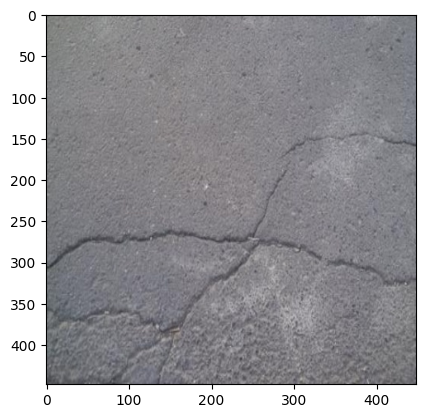

In [26]:
img1=cv2.imread(train_img[0])
img1=cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)
plt.imshow(img1)

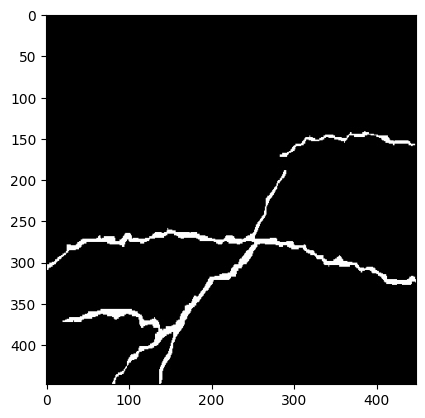

In [27]:
img1=cv2.imread(train_mask[0])
img1=cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)
plt.imshow(img1)

In [28]:
df_train= pd.DataFrame({'images': train_img, 'masks': train_mask})

df_train.sample(2)

,images,masks
1056,/kaggle/input/sccdnetcorrected/train/images/GA...,/kaggle/input/sccdnetcorrected/train/masks/GAP...
410,/kaggle/input/sccdnetcorrected/train/images/CR...,/kaggle/input/sccdnetcorrected/train/masks/CRA...


### transfroms training

In [29]:
train_transforms = T.Compose([
    T.ToPILImage(),
    T.Resize((image_size,image_size)),
    T.ToTensor()
])

In [30]:
x=train_transforms(img1)

In [31]:
x.shape

torch.Size([3, 448, 448])

In [32]:
class CrackDataset(Dataset):
    def __init__(self, dataset, transforms=None):
        self.dataset = dataset.reset_index(drop=True)
        self.transforms = transforms
        
    def __len__(self):
        return len(self.dataset)
    
    def __getitem__(self, ix):
        row = self.dataset.loc[ix].squeeze()
        image_path = row['images']
        mask_path = row['masks']
        
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        if self.transforms:
            image_tensor = self.transforms(image).float()
        else:
            image_tensor=T.ToPILImage()(image)
            image_tensor=T.ToTensor()((image_tensor))
            
       

        
        mask = cv2.imread(mask_path)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
        mask = cv2.resize(mask, (image_size, image_size))
        _, mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)
        mask=mask/255.0
            
        mask_tensor = torch.as_tensor(mask[None], dtype=torch.float32)
        
        # mask_tensor /= 255.
        
        return image_tensor, mask_tensor
    
    def collate_fn(self, batch):
        images, masks = tuple(zip(*batch))
        images = [img[None] for img in images]
        masks = [msk[None] for msk in masks]
        images, masks = [torch.cat(i).to(device) for i in [images, masks]]
        return images, masks

In [33]:
train_dataset= CrackDataset(df_train,train_transforms)

In [34]:
z=train_dataset[0]
z[0].shape

torch.Size([3, 448, 448])

In [35]:
z=z[0].detach().cpu().numpy()

In [ ]:
z

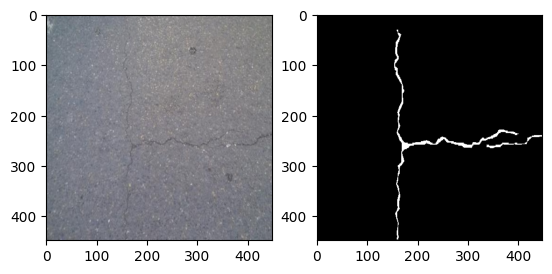

In [36]:

plt.subplot(121)
plt.imshow(train_dataset[1][0].cpu().detach().numpy().transpose(1,2,0))
plt.subplot(122)
plt.imshow(train_dataset[1][1].cpu().detach().numpy().transpose(1,2,0), cmap='gray')

##  valid dataset

In [37]:
v_path_images = '/kaggle/input/sccdnetcorrected/test/images'
v_path_masks = '/kaggle/input/sccdnetcorrected/test/masks'


In [38]:
valid_img,valid_mask=img_mask_loading(v_path_images,v_path_masks)

In [39]:
valid_img[0],valid_mask[0]

('/kaggle/input/sccdnetcorrected/test/images/CFD_001.jpg',
 '/kaggle/input/sccdnetcorrected/test/masks/CFD_001.jpg')

In [40]:
df_valid= pd.DataFrame({'images': valid_img, 'masks': valid_mask})

df_valid.sample(2)

,images,masks
746,/kaggle/input/sccdnetcorrected/test/images/cra...,/kaggle/input/sccdnetcorrected/test/masks/crac...
671,/kaggle/input/sccdnetcorrected/test/images/Ris...,/kaggle/input/sccdnetcorrected/test/masks/Riss...


In [41]:
valid_dataset = CrackDataset(df_valid)

Index:  420


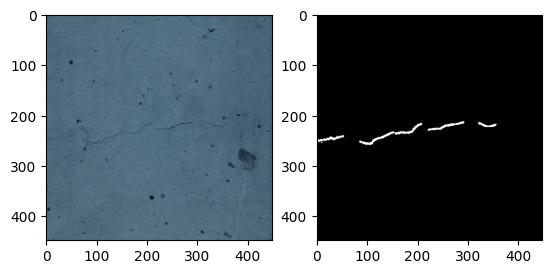

In [42]:
x=np.random.randint(0, len(df_valid))
print("Index: ",x)
plt.subplot(121)
plt.imshow(valid_dataset[x][0].cpu().detach().numpy().transpose(1,2,0))
plt.subplot(122)
plt.imshow(valid_dataset[x][1].cpu().detach().numpy().transpose(1,2,0), cmap='gray')

## data loader

In [45]:
train_dataloader=DataLoader(train_dataset, batch_size=batch_size, shuffle=True, collate_fn=train_dataset.collate_fn, drop_last=True)
valid_dataloader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=True, collate_fn=valid_dataset.collate_fn, drop_last=True)

In [46]:
for i in train_dataloader:
    print(i[0].shape)
    print(i[1].shape)
    break

torch.Size([5, 3, 448, 448])
torch.Size([5, 1, 448, 448])


In [47]:
for i in valid_dataloader:
    print(i[0].shape)
    print(i[1].shape)
    break

torch.Size([5, 3, 448, 448])
torch.Size([5, 1, 448, 448])


In [48]:
BATCHNORM_TRACK_RUNNING_STATS = False
BATCHNORM_MOVING_AVERAGE_DECAY = 0.9997

## model BUilding 

In [49]:
class BNorm_init(nn.BatchNorm2d):
    def reset_parameters(self):
        init.uniform_(self.weight, 0, 1)
        init.zeros_(self.bias)

In [50]:
class Conv2d_init(nn.Conv2d):
    def __init__(self, in_channels, out_channels, kernel_size, stride=1, padding=0, dilation=1, groups=1, bias=True, padding_mode="zeros"):
        super(Conv2d_init, self).__init__(in_channels, out_channels, kernel_size, stride, padding, dilation, groups, bias, padding_mode)

    def reset_parameters(self):
        init.xavier_normal_(self.weight)
        if self.bias is not None:
            fan_in, _ = init._calculate_fan_in_and_fan_out(self.weight)
            bound = 1 / math.sqrt(fan_in)
            init.uniform_(self.bias, -bound, bound)

In [51]:
def _conv_block(in_channels, out_channels, kernel_size, padding):
    return nn.Sequential(Conv2d_init(in_channels=in_channels, out_channels=out_channels,
                                     kernel_size=kernel_size, padding=padding, bias=False),
                         FeatureNorm(num_features=out_channels, eps=0.001),
                         nn.ReLU())

In [52]:
class FeatureNorm(nn.Module):
    def __init__(self, num_features, feature_index=1, rank=4, reduce_dims=(2, 3), eps=0.001, include_bias=True):
        super(FeatureNorm, self).__init__()
        self.shape = [1] * rank
        self.shape[feature_index] = num_features
        self.reduce_dims = reduce_dims

        self.scale = nn.Parameter(torch.ones(self.shape, requires_grad=True, dtype=torch.float))
        self.bias = nn.Parameter(torch.zeros(self.shape, requires_grad=True, dtype=torch.float)) if include_bias else nn.Parameter(
            torch.zeros(self.shape, requires_grad=False, dtype=torch.float))

        self.eps = eps

    def forward(self, features):
        f_std = torch.std(features, dim=self.reduce_dims, keepdim=True)
        f_mean = torch.mean(features, dim=self.reduce_dims, keepdim=True)
        return self.scale * ((features - f_mean) / (f_std + self.eps).sqrt()) + self.bias

In [53]:
class DownSampling(nn.Module):
    """
    DownSampling blok - na zacetku lahko dodamo MaxPooling
    """
    def __init__(self, pooling, n_conv_blocks, in_channels, out_channels, kernel_size, padding):
        super(DownSampling, self).__init__()
        self.downsample = nn.Sequential()

        if pooling:
            self.downsample.add_module('max_pooling', nn.MaxPool2d(2))

        for i in range(n_conv_blocks):
            self.downsample.add_module(f'conv_block_{i+1}', _conv_block(in_channels, out_channels, kernel_size, padding))
            in_channels = out_channels
    
    def forward(self, x):
        x = self.downsample(x)
        return x

In [54]:
with torch.no_grad():
    
    t1=torch.rand((1,3,448,448),dtype=torch.float32)
    # 32,448,448
    out1=_conv_block(in_channels=3,out_channels=32,kernel_size=5,padding=2)(t1)
    print(out1)
    print(out1.shape)
    

tensor([[[[1.1822, 0.6591, 0.5198,  ..., 0.7200, 0.5121, 0.2933],
          [0.7912, 0.1081, 0.5948,  ..., 0.2493, 0.0823, 0.6747],
          [0.1566, 0.7060, 0.0000,  ..., 0.0000, 0.0962, 0.1275],
          ...,
          [0.2600, 0.2146, 0.2772,  ..., 0.0000, 0.0000, 0.2732],
          [0.3729, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0378],
          [0.5450, 0.1927, 0.0000,  ..., 0.0000, 0.2027, 0.3712]],

         [[0.0000, 0.1349, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.3139,  ..., 0.0000, 0.0000, 0.1075],
          [0.0000, 0.0000, 0.1571,  ..., 0.0000, 0.1095, 0.0000],
          ...,
          [0.1971, 0.0000, 0.6244,  ..., 0.4556, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.2650],
          [0.0000, 0.0000, 0.1070,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.3267, 0.3530, 0.0264,  ..., 0.0000, 0.0000, 0.0000],
          [0.9259, 0.4588, 0.0000,  ..., 0.0000, 0.0905, 0.0352],
          [0.3185, 0.4648, 0.0000,  ..., 0

In [55]:
v1=DownSampling(pooling=False,n_conv_blocks=3,in_channels=3,out_channels=32,kernel_size=5,padding=2)
v1_out=v1(t1)

In [56]:
v1_out.shape

torch.Size([1, 32, 448, 448])

In [57]:
# t1

In [58]:
# for name,i in v1.named_parameters():
#     print(f"{name} , paramerters {i.shape} ")

In [59]:
class UpSampling(nn.Module):
    """
    UpSampling blok - dekonvolucija(2x povečava resolucije) + konvolucija 
    """
    def __init__(self, n_conv_blocks, in_channels, out_channels, n_channels_connected, kernel_size, padding, stride=2):
        super(UpSampling, self).__init__()
        self.upsample = nn.ConvTranspose2d(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size, stride=stride)
        self.conv = nn.Sequential()

        for i in range(n_conv_blocks):
            if i == 0:
                self.conv.add_module(f'conv_block_{i+1}', _conv_block(n_channels_connected + out_channels, out_channels, kernel_size, padding))
            else:
                self.conv.add_module(f'conv_block_{i+1}', _conv_block(out_channels, out_channels, kernel_size, padding))

    def forward(self, x1, x2):
        x1 = self.upsample(x1)
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]
        x1 = F.pad(x1, (diffX // 2, diffX - diffX//2, diffY // 2, diffY - diffY//2))

        x = torch.cat([x2, x1], dim=1)
        x = self.conv(x)
        return x

In [60]:

class Se_module_diff(nn.Module):
    def __init__(self, inp, oup, Avg_size = 1, se_ratio = 1):
        super().__init__()
        self.avg = nn.AdaptiveAvgPool2d((Avg_size, Avg_size))
        num_squeezed_channels = max(1,int(inp / se_ratio))
        self._se_reduce = nn.Conv2d(in_channels=inp, out_channels=num_squeezed_channels, kernel_size=1)
        self._se_expand = nn.Conv2d(in_channels=num_squeezed_channels, out_channels=oup, kernel_size=1)
        self.Avg_size = Avg_size
        self.reset_parameters()

    #x and z are different conv layer and z pass through more convs
    def reset_parameters(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                n = m.kernel_size[0] * m.kernel_size[0] * m.out_channels
                m.weight.data.normal_(0, math.sqrt(2. / n))
                if m.bias is not None:
                    m.bias.data.zero_()
            elif isinstance(m, nn.BatchNorm2d):
                m.weight.data.fill_(1)
                m.bias.data.zero_()
            elif isinstance(m, nn.Linear):
                n = m.weight.size(1)
                m.weight.data.normal_(0, 0.01)
                m.bias.data.zero_()


    def forward(self, x, z):
        SIZE = z.size()
        y = self.avg(x)
        y = self._se_reduce(y)
        y = y * torch.sigmoid(y)
        y = self._se_expand(y)
        if self.Avg_size != 1:
            y = F.upsample_bilinear(y, size=[SIZE[2], SIZE[3]])
        z = torch.sigmoid(y) * z
        return z


In [61]:
conv1_s = nn.Conv2d(32, 32, kernel_size=1, stride=1, bias=False)

In [62]:
se1_out=conv1_s(v1_out)

In [63]:
se1_out.shape,v1_out.shape

(torch.Size([1, 32, 448, 448]), torch.Size([1, 32, 448, 448]))

In [64]:
se1=Se_module_diff(inp=32, oup=32)

In [65]:
se1


Se_module_diff(
  (avg): AdaptiveAvgPool2d(output_size=(1, 1))
  (_se_reduce): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1))
  (_se_expand): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1))
)

In [66]:
se1_diff=se1(v1_out,se1_out)

In [67]:
se1_diff.shape

torch.Size([1, 32, 448, 448])

In [68]:
se1_out

tensor([[[[-7.1777e-03,  6.1700e-03, -5.7187e-02,  ...,  3.9904e-02,
            2.3311e-01,  1.1969e-01],
          [-2.2047e-02, -1.2768e-01,  1.8789e-01,  ...,  3.0809e-01,
            7.7843e-02,  7.8393e-02],
          [-1.9928e-01,  1.0646e-01,  1.7984e-01,  ...,  3.9850e-01,
           -5.7664e-02, -5.2261e-02],
          ...,
          [ 9.0050e-02, -2.0975e-02, -4.2930e-01,  ..., -2.3975e-01,
           -6.4224e-02,  2.0227e-01],
          [-3.2387e-03, -2.4456e-01,  2.8564e-01,  ...,  3.2413e-01,
            1.2639e-01,  2.5387e-01],
          [-2.5005e-01, -3.8887e-01, -2.0353e-01,  ...,  1.6859e-02,
            8.4822e-02,  2.3131e-01]],

         [[-7.9809e-02, -1.6294e-01, -4.7839e-02,  ..., -5.8661e-02,
            2.3376e-01, -2.6336e-02],
          [-8.8216e-02, -5.9865e-02,  9.0000e-02,  ...,  1.2873e-02,
            8.4769e-02, -5.7277e-02],
          [-1.4709e-01,  8.2564e-02,  8.7946e-02,  ...,  1.4347e-01,
           -5.7999e-01, -1.8821e-01],
          ...,
     

In [69]:
se1_diff

tensor([[[[-4.0898e-03,  3.5156e-03, -3.2585e-02,  ...,  2.2737e-02,
            1.3282e-01,  6.8200e-02],
          [-1.2562e-02, -7.2750e-02,  1.0706e-01,  ...,  1.7555e-01,
            4.4354e-02,  4.4668e-02],
          [-1.1355e-01,  6.0661e-02,  1.0247e-01,  ...,  2.2706e-01,
           -3.2857e-02, -2.9778e-02],
          ...,
          [ 5.1310e-02, -1.1951e-02, -2.4461e-01,  ..., -1.3660e-01,
           -3.6594e-02,  1.1525e-01],
          [-1.8454e-03, -1.3935e-01,  1.6276e-01,  ...,  1.8469e-01,
            7.2014e-02,  1.4466e-01],
          [-1.4247e-01, -2.2158e-01, -1.1597e-01,  ...,  9.6059e-03,
            4.8331e-02,  1.3180e-01]],

         [[-3.9719e-02, -8.1092e-02, -2.3809e-02,  ..., -2.9194e-02,
            1.1634e-01, -1.3107e-02],
          [-4.3903e-02, -2.9794e-02,  4.4791e-02,  ...,  6.4065e-03,
            4.2188e-02, -2.8506e-02],
          [-7.3203e-02,  4.1090e-02,  4.3769e-02,  ...,  7.1403e-02,
           -2.8865e-01, -9.3669e-02],
          ...,
     

In [70]:
output_array = v1_out[0][0]


In [71]:
se1_diff.shape

torch.Size([1, 32, 448, 448])

In [ ]:
# plt.imshow(v1_out[0][0].detach().numpy())

In [72]:
output_array.shape

torch.Size([448, 448])

In [73]:
 up1=UpSampling(n_conv_blocks=3, in_channels=16, out_channels=8, n_channels_connected=32, kernel_size=5, padding=2)

In [74]:
x1=torch.rand((1,16,224,224),dtype=torch.float32)

In [75]:
x1.shape,se1_diff.shape

(torch.Size([1, 16, 224, 224]), torch.Size([1, 32, 448, 448]))

In [76]:
up1_out=up1(x1,se1_diff)

In [77]:
up1_out

tensor([[[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.3043, 0.2024, 0.2929,  ..., 0.0000, 0.0000, 0.0000],
          [0.4244, 0.0000, 0.0000,  ..., 0.0000, 0.6234, 1.1647],
          ...,
          [0.0727, 0.4462, 0.5869,  ..., 0.0000, 0.0277, 0.7861],
          [0.0000, 0.3057, 0.5136,  ..., 0.0000, 0.1454, 1.1146],
          [0.1263, 0.4453, 0.3482,  ..., 0.0000, 0.1385, 1.3759]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.2698,  ..., 0.4178, 0.0000, 0.1100],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0371],
          [0.0000, 0.0000, 0.0000,  ..., 0.3992, 0.1684, 0.0000],
          [0.0000, 0.0000, 0.1872,  ..., 0.1023, 0.5313, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0150],
          [0.0000, 0.1751, 0.3245,  ..., 0.1558, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0

In [78]:
up1_out.shape

torch.Size([1, 8, 448, 448])

In [79]:
class GradientMultiplyLayer(torch.autograd.Function):
    @staticmethod
    def forward(ctx, input, mask_bw):
        ctx.save_for_backward(mask_bw)
        return input

    @staticmethod
    def backward(ctx, grad_output):
        mask_bw, = ctx.saved_tensors
        return grad_output.mul(mask_bw), None

## main model

In [80]:
class SegDecNetPlusPlus(nn.Module):
    def __init__(self, device, input_width, input_height, input_channels):
        super(SegDecNetPlusPlus, self).__init__()
        if input_width % 8 != 0 or input_height % 8 != 0:
            raise Exception(f"Input size must be divisible by 8! width={input_width}, height={input_height}")
        self.input_width = input_width
        self.input_height = input_height
        self.input_channels = input_channels
        
        self.volume1 = DownSampling(pooling=False, n_conv_blocks=1, in_channels=self.input_channels, out_channels=32, kernel_size=5, padding=2)
        self.volume2 = DownSampling(pooling=True, n_conv_blocks=3, in_channels=32, out_channels=64, kernel_size=5, padding=2)
        self.volume3 = DownSampling(pooling=True, n_conv_blocks=4, in_channels=64, out_channels=64, kernel_size=5, padding=2)
        self.volume4 = DownSampling(pooling=True, n_conv_blocks=1, in_channels=64, out_channels=1024, kernel_size=15, padding=7)

        self.extractor = nn.Sequential(nn.MaxPool2d(kernel_size=2),
                                       _conv_block(in_channels=1025, out_channels=8, kernel_size=5, padding=2),
                                       nn.MaxPool2d(kernel_size=2),
                                       _conv_block(in_channels=8, out_channels=16, kernel_size=5, padding=2),
                                       nn.MaxPool2d(kernel_size=2),
                                       _conv_block(in_channels=16, out_channels=32, kernel_size=5, padding=2))

        self.global_max_pool_feat = nn.MaxPool2d(kernel_size=32)
        self.global_avg_pool_feat = nn.AvgPool2d(kernel_size=32)
        self.global_max_pool_seg = nn.MaxPool2d(kernel_size=(self.input_height / 8, self.input_width / 8))
        self.global_avg_pool_seg = nn.AvgPool2d(kernel_size=(self.input_height / 8, self.input_width / 8))

        self.fc = nn.Linear(in_features=66, out_features=1)

        # Custom autgrad funkcije - Gradient multiplyers
        self.volume_lr_multiplier_layer = GradientMultiplyLayer().apply
        self.glob_max_lr_multiplier_layer = GradientMultiplyLayer().apply
        self.glob_avg_lr_multiplier_layer = GradientMultiplyLayer().apply

        self.device = device

        # Upsampling
        self.upsampling1 = UpSampling(n_conv_blocks=1, in_channels=1024, out_channels=16, n_channels_connected=64, kernel_size=5, padding=2)
        self.upsampling2 = UpSampling(n_conv_blocks=4, in_channels=16, out_channels=16, n_channels_connected=64, kernel_size=5, padding=2)
        self.upsampling3 = UpSampling(n_conv_blocks=3, in_channels=16, out_channels=8, n_channels_connected=32, kernel_size=5, padding=2)
        self.upsampling4 = nn.Sequential(Conv2d_init(in_channels=8, out_channels=1, kernel_size=5, padding=2, bias=False), FeatureNorm(num_features=1, eps=0.001, include_bias=False))

        # Downsampling
        self.downsampling = nn.AvgPool2d(8)
        
        # SSE Module
        self.conv1_s = nn.Conv2d(32, 32, kernel_size=1, stride=1, bias=False)
        self.conv2_s = nn.Conv2d(64, 64, kernel_size=1, stride=1, bias=False)
        self.conv3_s = nn.Conv2d(64, 64, kernel_size=1, stride=1, bias=False)

        self.se_module_diff1 = Se_module_diff(inp=32, oup=32)
        self.se_module_diff2 = Se_module_diff(inp=64, oup=64)
        self.se_module_diff2 = Se_module_diff(inp=64, oup=64)

    def set_gradient_multipliers(self, multiplier):
        self.volume_lr_multiplier_mask = (torch.ones((1,)) * multiplier).to(self.device)
        self.glob_max_lr_multiplier_mask = (torch.ones((1,)) * multiplier).to(self.device)
        self.glob_avg_lr_multiplier_mask = (torch.ones((1,)) * multiplier).to(self.device)

    def forward(self, input):
        v1 = self.volume1(input)
        v2 = self.volume2(v1)
        v3 = self.volume3(v2)
        v4 = self.volume4(v3)

        conv1_s = self.conv1_s(v1)
        conv1_sse = self.se_module_diff1(v1, conv1_s)

        conv2_s = self.conv2_s(v2)
        conv2_sse = self.se_module_diff2(v2, conv2_s)
        
        conv3_s = self.conv3_s(v3)
        conv3_sse = self.se_module_diff2(v3, conv3_s)

        seg_mask_upsampled = self.upsampling1(v4, conv3_sse)
        seg_mask_upsampled = self.upsampling2(seg_mask_upsampled, conv2_sse)
        seg_mask_upsampled = self.upsampling3(seg_mask_upsampled, conv1_sse)
        seg_mask_upsampled = self.upsampling4(seg_mask_upsampled)

        seg_mask_downsampled = self.downsampling(seg_mask_upsampled)

        cat = torch.cat([v4, seg_mask_downsampled], dim=1)

        cat = self.volume_lr_multiplier_layer(cat, self.volume_lr_multiplier_mask)

        features = self.extractor(cat)
        global_max_feat = torch.max(torch.max(features, dim=-1, keepdim=True)[0], dim=-2, keepdim=True)[0] # torch.Size([1, 32, 1, 1])
        global_avg_feat = torch.mean(features, dim=(-1, -2), keepdim=True) # torch.Size([1, 32, 1, 1])
        global_max_seg = torch.max(torch.max(seg_mask_upsampled, dim=-1, keepdim=True)[0], dim=-2, keepdim=True)[0] # torch.Size([1, 1, 1, 1])
        global_avg_seg = torch.mean(seg_mask_upsampled, dim=(-1, -2), keepdim=True) # torch.Size([1, 1, 1, 1])

        global_max_feat = global_max_feat.reshape(global_max_feat.size(0), -1) # torch.Size([1, 32])
        global_avg_feat = global_avg_feat.reshape(global_avg_feat.size(0), -1) # torch.Size([1, 32])

        global_max_seg = global_max_seg.reshape(global_max_seg.size(0), -1) # torch.Size([1, 1])
        global_max_seg = self.glob_max_lr_multiplier_layer(global_max_seg, self.glob_max_lr_multiplier_mask) # (torch.Size([1, 1]), torch.Size([1])) -> torch.Size([1, 1])
        global_avg_seg = global_avg_seg.reshape(global_avg_seg.size(0), -1) # torch.Size([1, 1])
        global_avg_seg = self.glob_avg_lr_multiplier_layer(global_avg_seg, self.glob_avg_lr_multiplier_mask) # (torch.Size([1, 1]), torch.Size([1])) -> torch.Size([1, 1])

        fc_in = torch.cat([global_max_feat, global_avg_feat, global_max_seg, global_avg_seg], dim=1) # torch.Size([1, 66])
        fc_in = fc_in.reshape(fc_in.size(0), -1) # torch.Size([1, 66])
        prediction = self.fc(fc_in) # torch.Size([1, 1])
        return prediction, seg_mask_upsampled

In [81]:
device

'cuda'

In [82]:
type(device)

str

In [83]:
# model.device

In [131]:
model=SegDecNetPlusPlus(device,448,448,3)

In [132]:
if next(model.parameters()).is_cuda:
    print("Model is on CUDA (GPU)")
else:
    print("Model is on CPU")

Model is on CPU


In [133]:
model=model.to(device)

In [134]:
import torch
import torch.nn as nn

# Define your model
  # Replace with your actual model class


# Calculate the number of parameters
num_params = sum(p.numel() for p in model.parameters())
print(f"Number of Parameters: {num_params}")

# Calculate the GPU memory usage
# Note: This is an estimate and might not be entirely accurate.
# The actual memory usage can depend on various factors.
if device == "cuda":
    memory_allocated = torch.cuda.memory_allocated(device) / 1e6  # in megabytes
    memory_cached = torch.cuda.memory_reserved(device) / 1e6  # in megabytes
    print(f"GPU Memory Allocated: {memory_allocated:.2f} MB")
    print(f"GPU Memory Cached: {memory_cached:.2f} MB")


Number of Parameters: 16171485
GPU Memory Allocated: 3632.13 MB
GPU Memory Cached: 4852.81 MB


In [135]:
model

SegDecNetPlusPlus(
  (volume1): DownSampling(
    (downsample): Sequential(
      (conv_block_1): Sequential(
        (0): Conv2d_init(3, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2), bias=False)
        (1): FeatureNorm()
        (2): ReLU()
      )
    )
  )
  (volume2): DownSampling(
    (downsample): Sequential(
      (max_pooling): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (conv_block_1): Sequential(
        (0): Conv2d_init(32, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2), bias=False)
        (1): FeatureNorm()
        (2): ReLU()
      )
      (conv_block_2): Sequential(
        (0): Conv2d_init(64, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2), bias=False)
        (1): FeatureNorm()
        (2): ReLU()
      )
      (conv_block_3): Sequential(
        (0): Conv2d_init(64, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2), bias=False)
        (1): FeatureNorm()
        (2): ReLU()
      )
    )
  )
  (volume3):

In [136]:
model.fc

Linear(in_features=66, out_features=1, bias=True)

In [137]:
t1.shape

torch.Size([1, 3, 448, 448])

In [138]:
model.set_gradient_multipliers(0.0)

In [139]:
model.zero_grad()

In [140]:
t2=t1.to(device)

In [141]:
with torch.no_grad():
    model_out1=model(t2)

# 

In [142]:
model_out1

(tensor([[-0.5540]], device='cuda:0'),
 tensor([[[[-0.4120, -0.0568,  0.2616,  ...,  0.6899, -0.1878,  0.0033],
           [-0.4587,  0.1549,  0.2543,  ...,  0.2271,  0.3967, -0.1730],
           [ 0.2100, -0.5216, -0.2730,  ...,  0.4273, -0.3377, -0.6149],
           ...,
           [ 0.4192,  0.1927, -0.4367,  ...,  0.4265, -0.2200, -0.4558],
           [-0.5125, -0.2673, -0.2215,  ..., -0.1127, -0.4070, -0.2381],
           [-0.4426, -0.4694, -0.2466,  ..., -0.2942, -0.2779, -0.2547]]]],
        device='cuda:0'))

In [143]:
torch.max(model_out1[1])

tensor(2.9145, device='cuda:0')

In [144]:
mask = torch.randint(0, 2, size=(1,1,448,448), dtype=torch.float32)

In [145]:
mask=mask.to(device)

In [146]:
mask.shape

torch.Size([1, 1, 448, 448])

In [147]:
model_out1[1].shape

torch.Size([1, 1, 448, 448])

In [148]:
x2=model_out1[1]

In [149]:
mask.shape,x2.shape

(torch.Size([1, 1, 448, 448]), torch.Size([1, 1, 448, 448]))

In [150]:
type(mask)

torch.Tensor

In [151]:
criterion=nn.BCEWithLogitsLoss()

In [152]:
criterion(x2,mask)

tensor(0.7412, device='cuda:0')

In [153]:
class EarlyStopping:
    def __init__(self, patience=5, min_delta=0, path=path):
        self.path = path
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = np.inf
        self.early_stop = False
        
    def __call__(self, val_loss, model=None):
        if self.best_loss - val_loss > self.min_delta:
            torch.save(model.state_dict(), self.path)
            print(f'Model saved to: {self.path}')
            self.best_loss = val_loss
            self.counter = 0
        elif self.best_loss - val_loss < self.min_delta:
            self.counter += 1
            print(f"INFO: Early stopping counter {self.counter} of {self.patience}")
            if self.counter >= self.patience:
                print('INFO: Early stopping')
                self.early_stop = True

In [172]:
@torch.no_grad()
def validate_test_image(model, dataset,n=None):
    if n:
        idx=n
    else:
        idx = np.random.randint(len(dataset))
    dataset = dataset.reset_index(drop=True)
    row = dataset.loc[idx].squeeze()
    
    image = cv2.imread(row['images'])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_tensor = train_transforms(image).unsqueeze(0).to(device)
    
    mask = cv2.imread(row['masks'])
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
    mask = cv2.resize(mask, (image_size, image_size))
    _, mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)
    class_out=np.max(mask)
    
#     print((mask==255).sum())

    mask=np.expand_dims(mask, axis=-1)

    
    
    
    print("shape of image",image_tensor.shape,"mask.shape",mask.shape)
    model.eval()
    output = model(image_tensor)
    class_pred,seg_pred=output
    class_pred=torch.sigmoid(class_pred).item()
    seg_pred=seg_pred.squeeze(0)
#     print(class_pred)
#     print(seg_pred)
#     print(seg_pred.shape)

    seg_pred=torch.sigmoid(seg_pred)
    seg_pred=seg_pred.detach().cpu()
#     print(seg_pred)
    seg_pred=(seg_pred > 0.5).float()
#     print(seg_pred)
    seg_pred=seg_pred.numpy().transpose(1,2,0)
#     plt.imshow(seg,cmap="gray")
    
    
#     image_pil = tensor_to_pil(output[0].detach().cpu())
# Convert the tensor to a PIL Image
    
#     output = output[0].cpu().detach().numpy().transpose(1,2,0)

#     print(output.shape)
  
    
    plt.figure(figsize=(8, 4))
    plt.subplot(131)
    plt.title('Original image')
    plt.imshow(image)
    
    plt.subplot(132)
    plt.title('Original mask')
    plt.imshow(mask, cmap='gray')
    
    plt.subplot(133)
    plt.title('Predicted mask')
    plt.imshow(seg_pred,cmap="gray")
    print("Predicted Classfication out: ",class_pred)
    print("actual Classfication out: ",class_out/255.0)

    
#     print(output)
    
    plt.tight_layout()
    plt.show()
    plt.pause(0.001)

shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.3843892514705658
actual Classfication out:  0.0


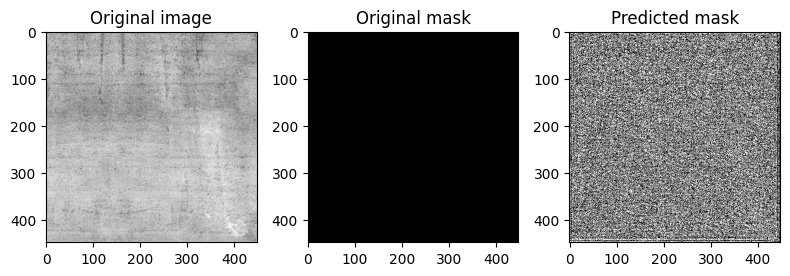

In [158]:
validate_test_image(model, df_valid)

In [159]:
def precision_tensor(y_true, y_pred):
    # Calculate True Positives (TP)
    TP = torch.sum(y_true * y_pred)

    # Calculate False Positives (FP)
    FP = torch.sum((1 - y_true) * y_pred)

    # Compute precision
    epsilon = 1e-15  # Small value to avoid division by zero
    precision_value = (TP ) / (TP + FP + epsilon)

    return precision_value

In [160]:
def recall_tensor(y_true, y_pred):
    # Calculate True Positives (TP)
    TP = torch.sum(y_true * y_pred)

    # Calculate False Negatives (FN)
    FN = torch.sum(y_true * (1 - y_pred))

    # Compute recall
    epsilon = 1e-15  # Small value to avoid division by zero
    recall_value = (TP ) / (TP + FN + epsilon)

    return recall_value

In [161]:
test=train_dataset[2]
test[0].shape

torch.Size([3, 448, 448])

In [162]:
inp=test[0].unsqueeze(0)
inp.shape

torch.Size([1, 3, 448, 448])

In [163]:
def find_metrics(outputs, masks, threshold=threshold):
    dice_scores = []
    iou_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
#     class_loss=[]
#     outputs=outputs[1]
#     print("Metrics")
#     print(outputs.shape)
#     print(masks.shape)
    outputs = torch.sigmoid(outputs)
    for i in range(batch_size):
        with torch.no_grad():
           
            y_pred = (outputs[i] > threshold).float()
            intersection = torch.logical_and(y_pred, masks[i])
            union = torch.logical_or(y_pred, masks[i])

            iou1 = (torch.sum(intersection) + 1e-15) / (torch.sum(union) + 1e-15)
            dice1 = (2 * torch.sum(intersection) + 1e-15) / (torch.sum(y_pred) + torch.sum(masks[i]) + 1e-15)
            
            precision1 = precision_tensor(y_pred, masks[i])
            recall1 = recall_tensor(y_pred, masks[i])
            f11 = (2 * precision1 * recall1) / (precision1 + recall1)

            dice_scores.append(dice1)
            iou_scores.append(iou1)
            precision_scores.append(precision1)
            recall_scores.append(recall1)
            f1_scores.append(f11)

    return {
        'dice': torch.mean(torch.tensor(dice_scores, device='cpu')),
        'iou': torch.mean(torch.tensor(iou_scores, device='cpu')),
        'precision': torch.mean(torch.tensor(precision_scores, device='cpu')),
        'recall': torch.mean(torch.tensor(recall_scores, device='cpu')),
        'f1_score': torch.mean(torch.tensor(f1_scores, device='cpu'))
    }


In [114]:
# # outputs=None
# # predicted=None
# for _, batch in enumerate(tqdm(train_dataloader, leave=False)):
#             model.eval()
#             inputs = batch[0]
#             targets = batch[1]


# # Assuming your binary masks are in the `targets` tensor
# # `targets` is of size (batch_size, 1, 448, 448)



#             outputs = model(inputs)
#             print(outputs)
#             print(outputs[0].shape)
#             print(outputs[1].shape)
#             print(seg_loss_ctr(outputs[1].cpu(),targets.cpu()))
#             print(class_loss_ctr(outputs[0].cpu(),torch.rand((5,1))))
#             print(find_metrics(outputs[1], targets, threshold=0.5))
# # #             _, predicted = torch.max(outputs, 1)
#             break
    

In [164]:
model=model.to(device)
# criterion= torchvision.ops.sigmoid_focal_loss
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)  # if unfreeze=True -> 1e-4, 1e-5, so not to ruin good init w
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3, min_lr=1e-6, factor=0.1)
early = EarlyStopping()

seg_loss_ctr=nn.BCEWithLogitsLoss()
class_loss_ctr=nn.BCEWithLogitsLoss()
# Loss function and optimizer
seg_weight_factor=1
class_weight_factor=0.1
#set gradients of the model
model.set_gradient_multipliers(0.0)

In [168]:
for batch_idx, (inputs, targets) in enumerate(tqdm(train_dataloader, leave=False)):
    print(batch_idx)
    if batch_idx == 4:
        break

  0%|          | 0/1232 [00:00<?, ?it/s]

0
1
2
3
4


Epoch 1/12


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.6381620958520862
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.958791196346283
actual Classfication out:  1.0


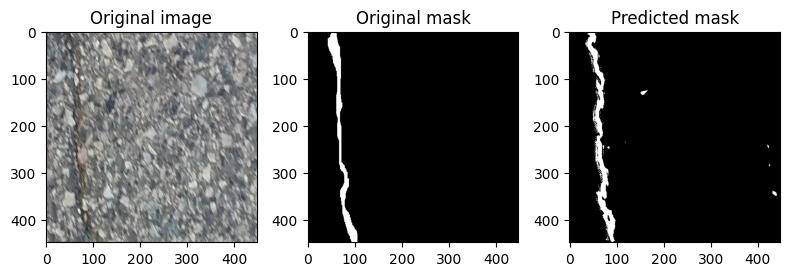

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9840238094329834
actual Classfication out:  1.0


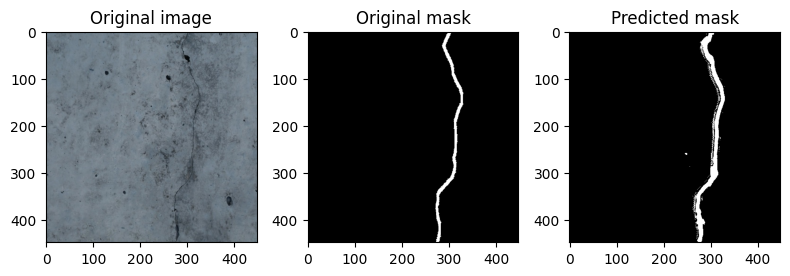

train_data visualize: loss:  1.26053411297023
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9302409887313843
actual Classfication out:  1.0


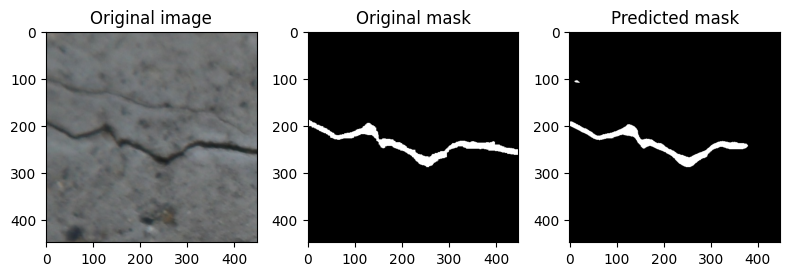

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.2135240137577057
actual Classfication out:  0.0


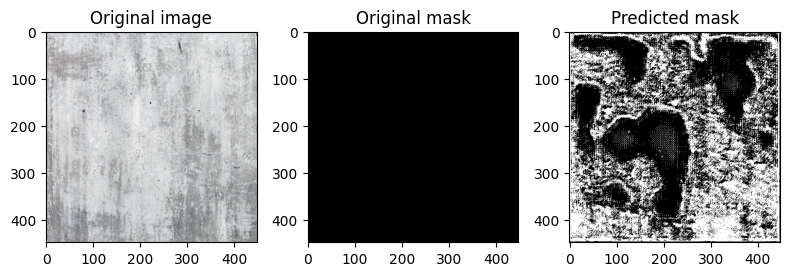

train_data visualize: loss:  1.867578256012771
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.987734854221344
actual Classfication out:  1.0


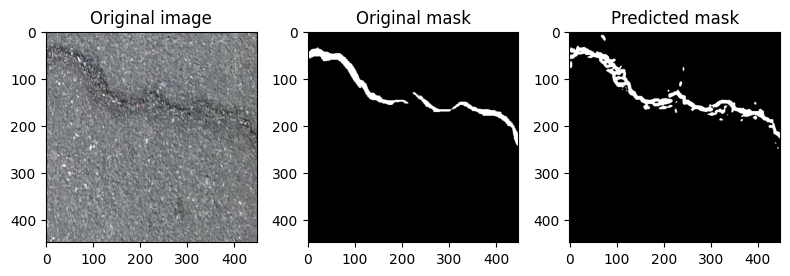

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9872249364852905
actual Classfication out:  1.0


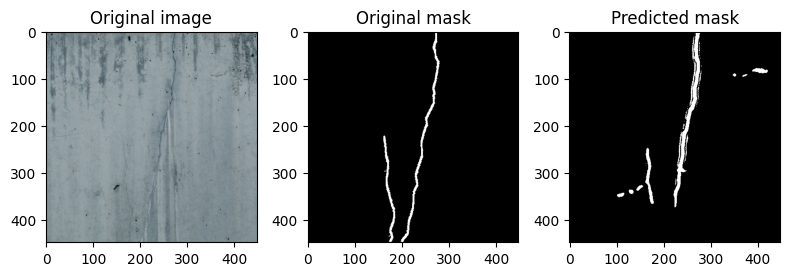

train_data visualize: loss:  2.456473226030472
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9857624769210815
actual Classfication out:  1.0


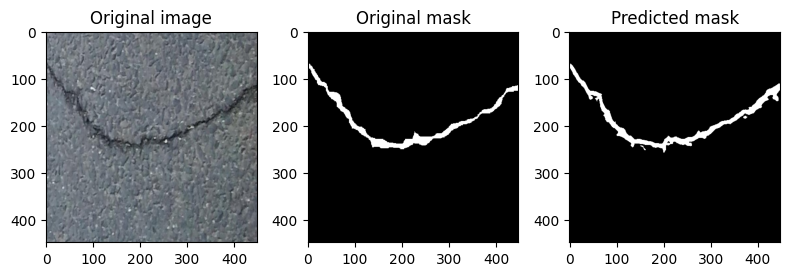

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.30200210213661194
actual Classfication out:  1.0


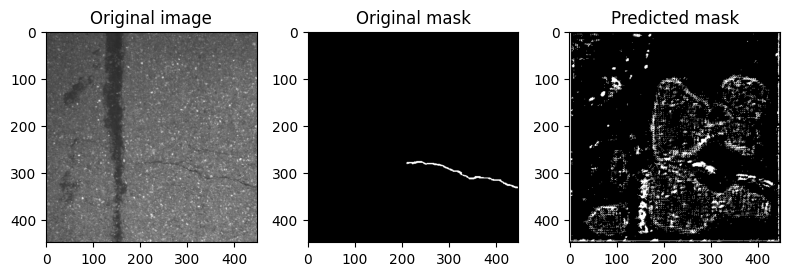

train_data visualize: loss:  3.028466085054604
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9860203862190247
actual Classfication out:  1.0


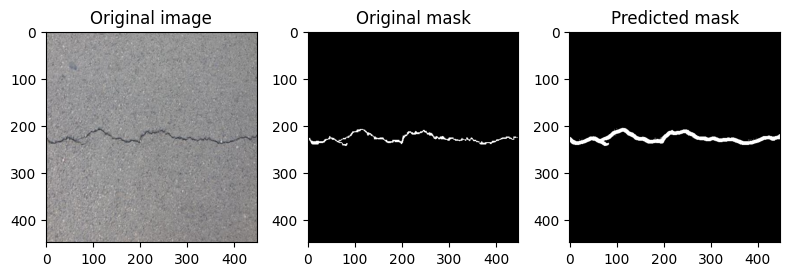

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9908746480941772
actual Classfication out:  1.0


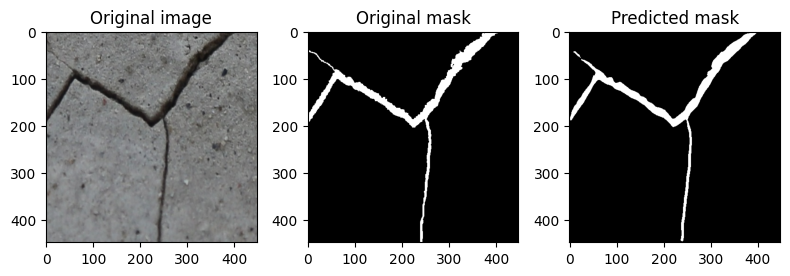

train_data visualize: loss:  3.5889921995806575
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9833968281745911
actual Classfication out:  1.0


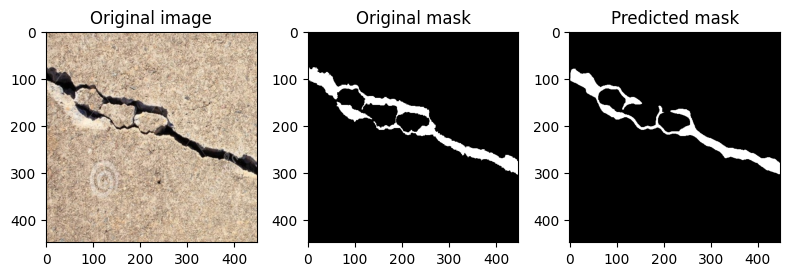

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9946117401123047
actual Classfication out:  1.0


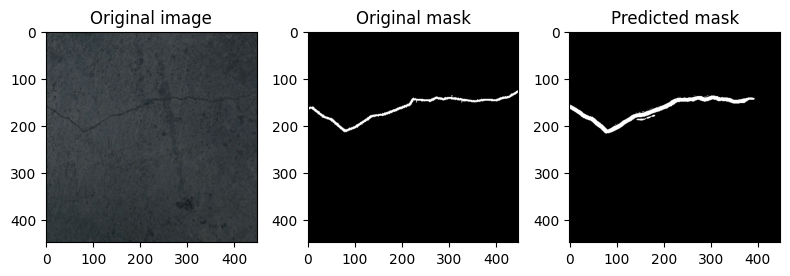

training_loss: 0.59759
training_iou: 0.36599
training_iou: 0.48619
Validation loss: 0.5581
Validation iou: 0.3638
Validation dice: 0.4781
Model saved to: seg_model.pth
Epoch 2/12


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.5430135346692184
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.986099898815155
actual Classfication out:  1.0


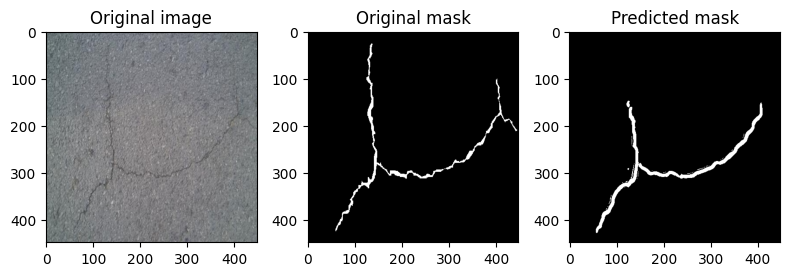

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.763321042060852
actual Classfication out:  1.0


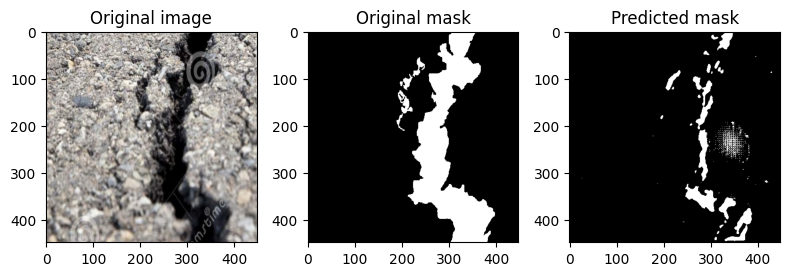

train_data visualize: loss:  1.085930769813472
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.989526629447937
actual Classfication out:  1.0


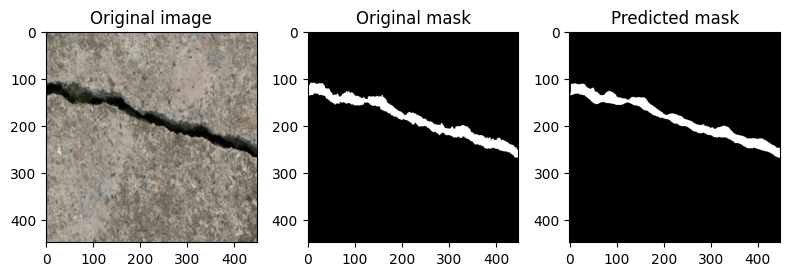

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.992621898651123
actual Classfication out:  1.0


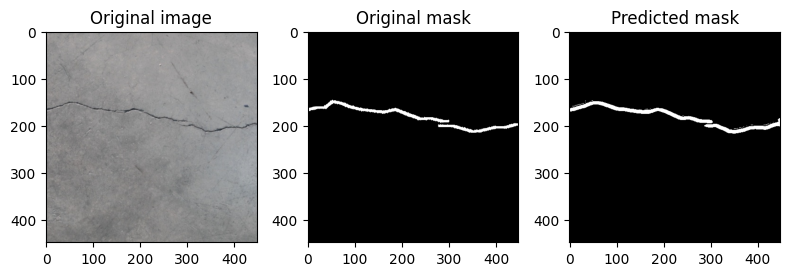

train_data visualize: loss:  1.608405236980598
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.996612012386322
actual Classfication out:  1.0


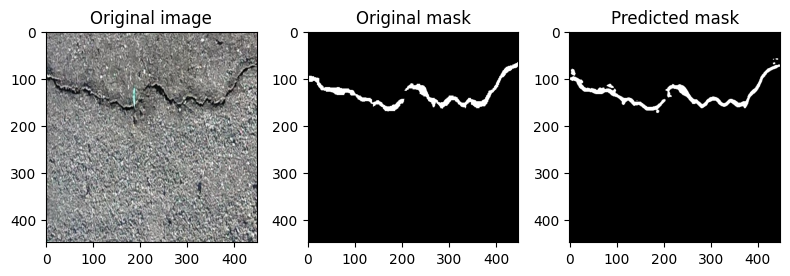

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.12660467624664307
actual Classfication out:  1.0


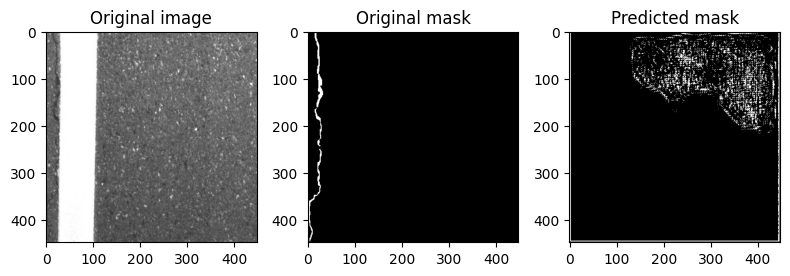

train_data visualize: loss:  2.128109922403185
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9937371015548706
actual Classfication out:  1.0


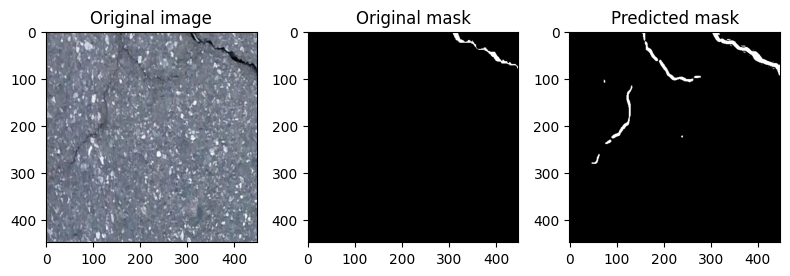

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9906376600265503
actual Classfication out:  1.0


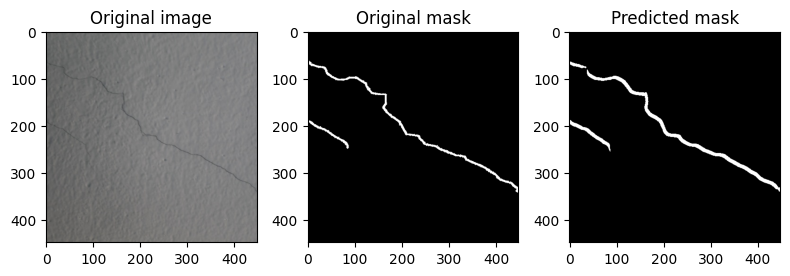

train_data visualize: loss:  2.634428350355825
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9808483123779297
actual Classfication out:  1.0


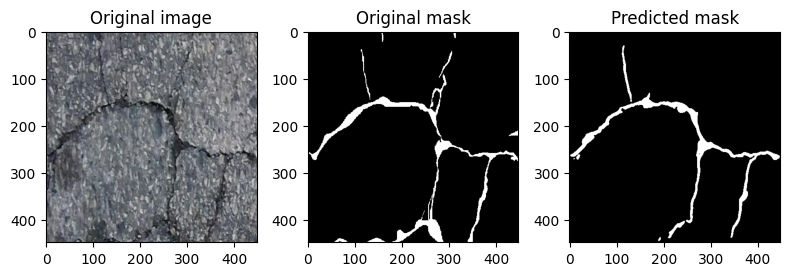

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9973028898239136
actual Classfication out:  1.0


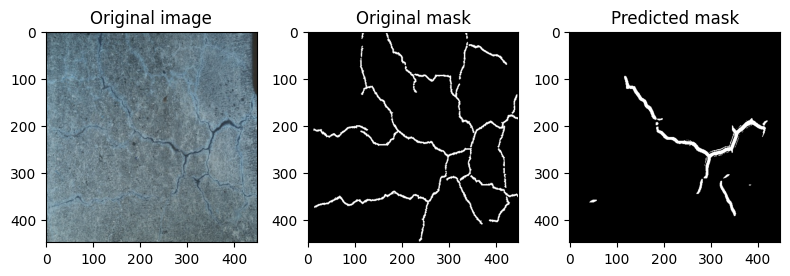

train_data visualize: loss:  3.1237227926994193
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9843117594718933
actual Classfication out:  1.0


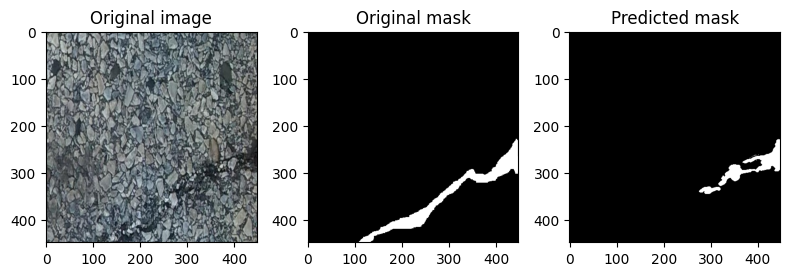

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9899433851242065
actual Classfication out:  1.0


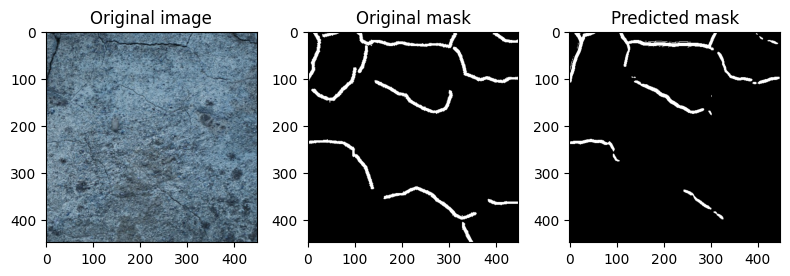

training_loss: 0.52055
training_iou: 0.38137
training_iou: 0.49791
Validation loss: 0.4951
Validation iou: 0.3708
Validation dice: 0.4817
Model saved to: seg_model.pth
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9976096153259277
actual Classfication out:  1.0


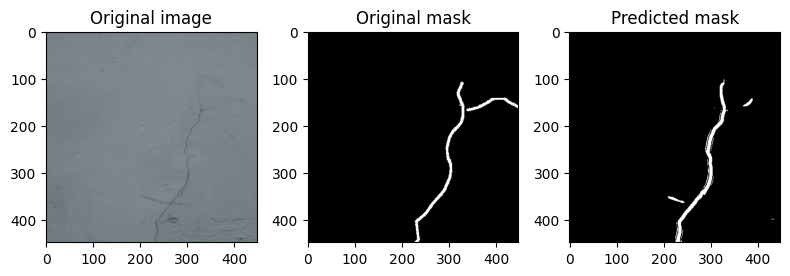

Epoch 3/12


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.48218372831203665
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9982115030288696
actual Classfication out:  1.0


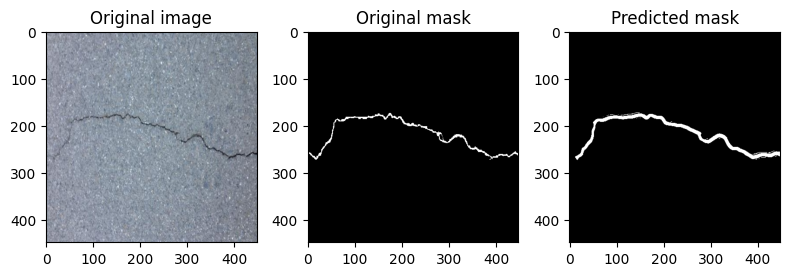

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9933285713195801
actual Classfication out:  1.0


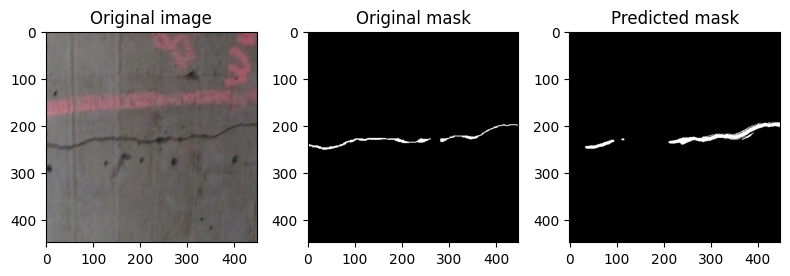

train_data visualize: loss:  0.9581444950526571
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9734442234039307
actual Classfication out:  1.0


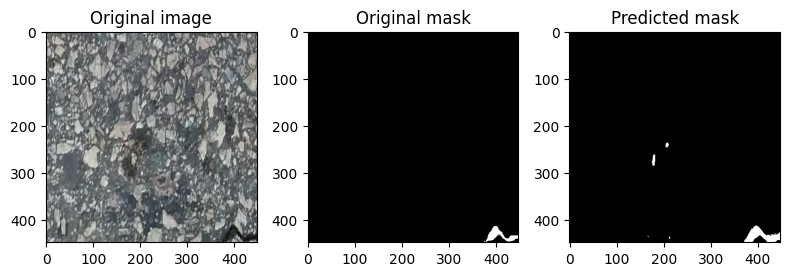

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9931824803352356
actual Classfication out:  1.0


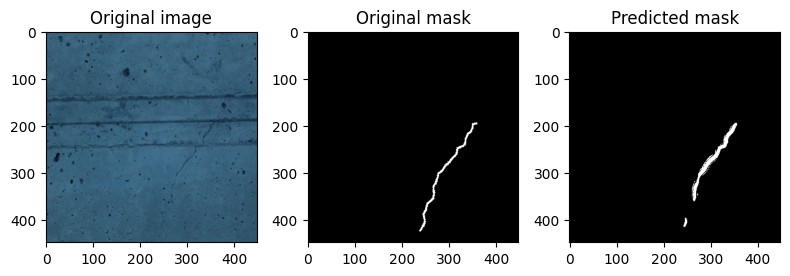

train_data visualize: loss:  1.422402785035777
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9995433688163757
actual Classfication out:  1.0


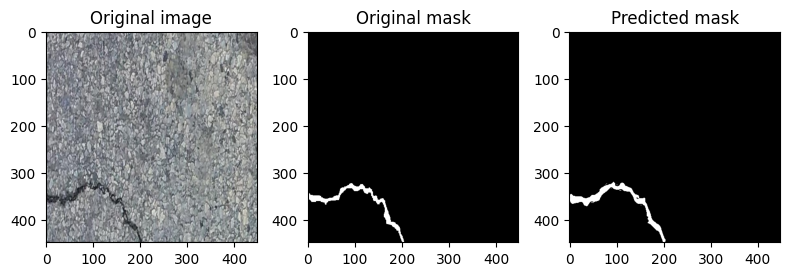

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.6651531457901001
actual Classfication out:  1.0


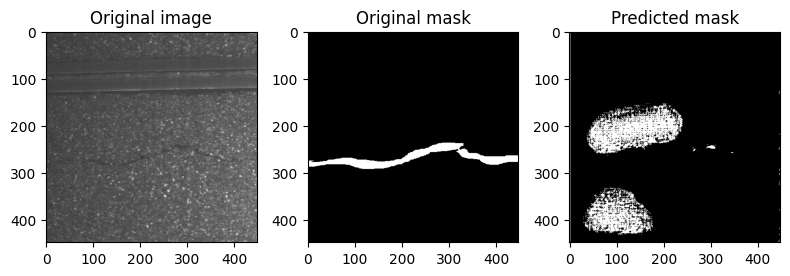

train_data visualize: loss:  1.8789605281035888
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9956943988800049
actual Classfication out:  1.0


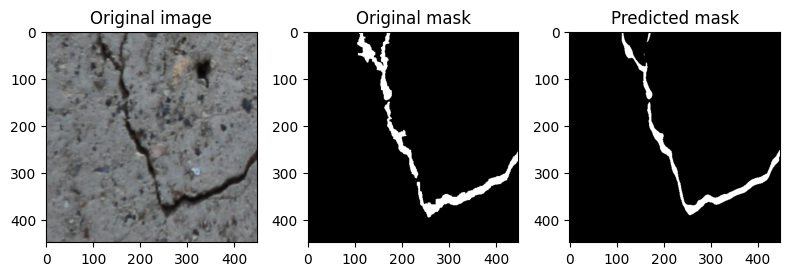

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.043213725090026855
actual Classfication out:  0.0


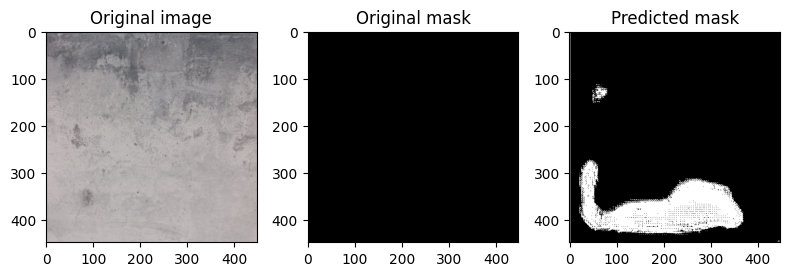

train_data visualize: loss:  2.3294426399498738
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9775651693344116
actual Classfication out:  1.0


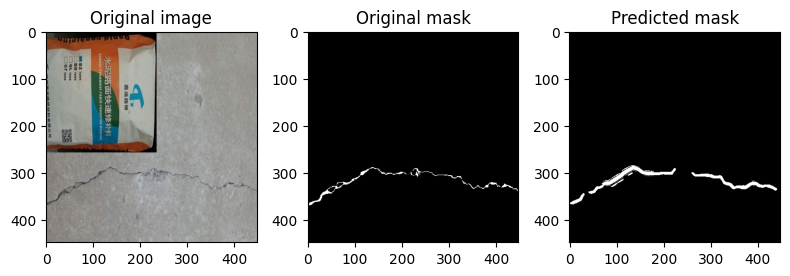

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9956914782524109
actual Classfication out:  1.0


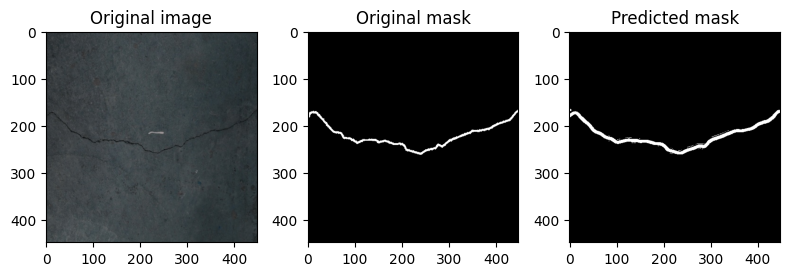

train_data visualize: loss:  2.7679569493667247
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.989586591720581
actual Classfication out:  1.0


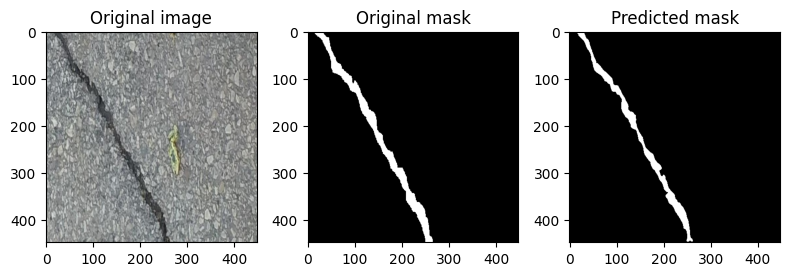

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9998095631599426
actual Classfication out:  1.0


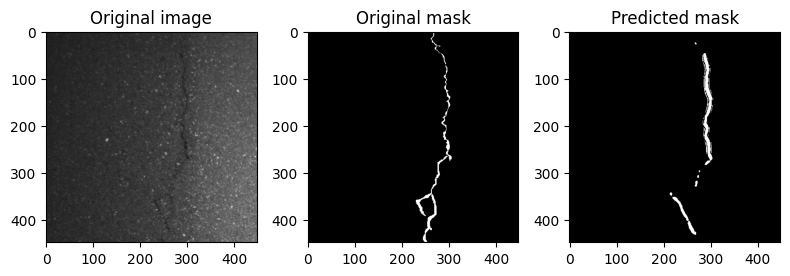

training_loss: 0.46116
training_iou: 0.37584
training_iou: 0.49028
Validation loss: 0.4430
Validation iou: 0.3696
Validation dice: 0.4811
Model saved to: seg_model.pth
Model saved after 3 epochs to seg_model.pth
Epoch 4/12


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.4290936219281164
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9956262111663818
actual Classfication out:  1.0


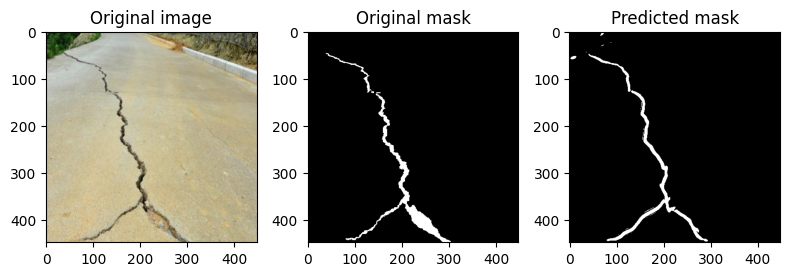

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9903061389923096
actual Classfication out:  1.0


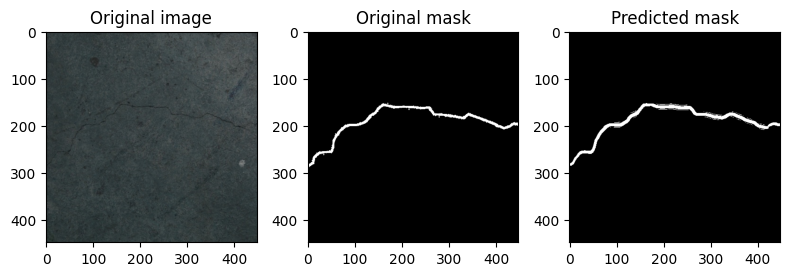

train_data visualize: loss:  0.8541672370703937
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9982455968856812
actual Classfication out:  1.0


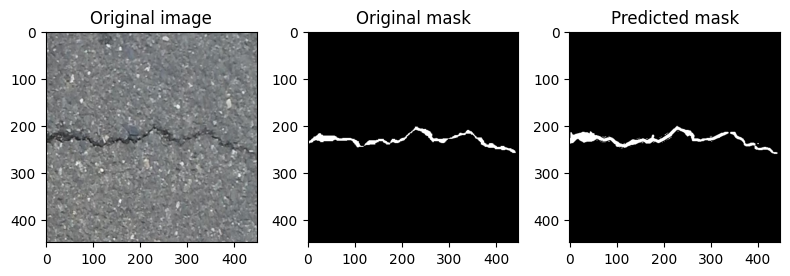

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9672315716743469
actual Classfication out:  1.0


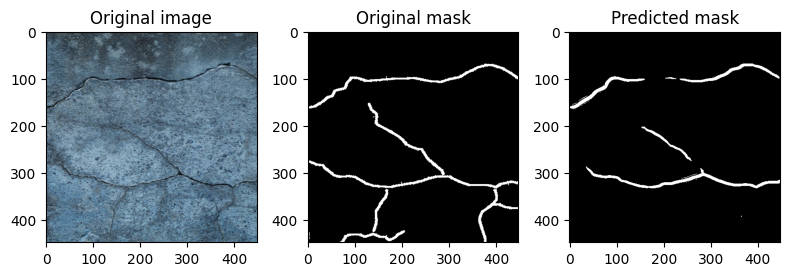

train_data visualize: loss:  1.2673816397565927
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9931092262268066
actual Classfication out:  1.0


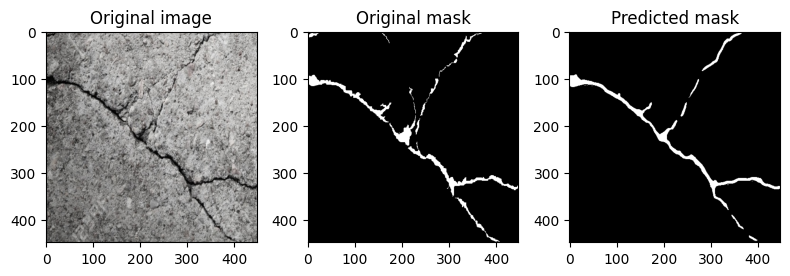

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.7099828720092773
actual Classfication out:  1.0


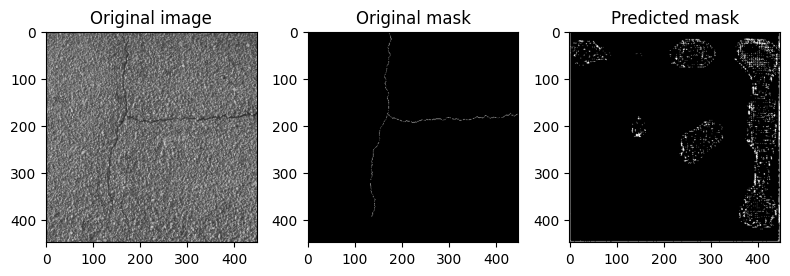

train_data visualize: loss:  1.6885467911588734
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9753418564796448
actual Classfication out:  1.0


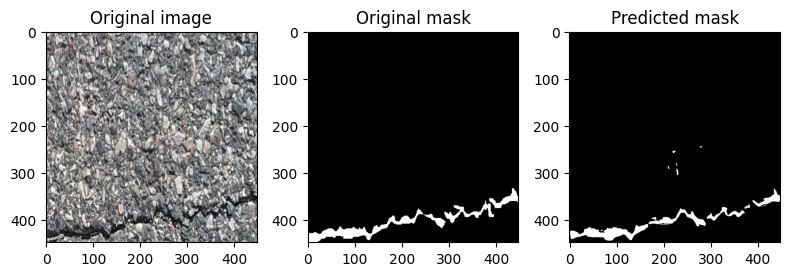

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9912740588188171
actual Classfication out:  1.0


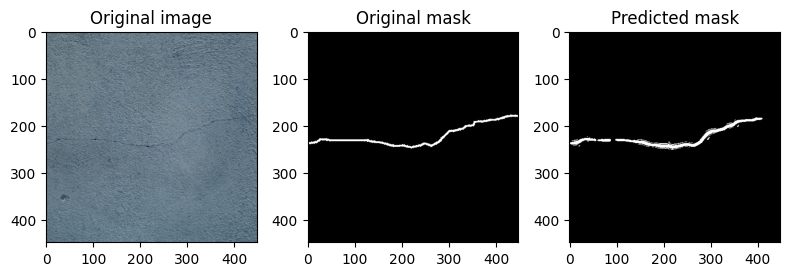

train_data visualize: loss:  2.0926491590262635
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9964816570281982
actual Classfication out:  1.0


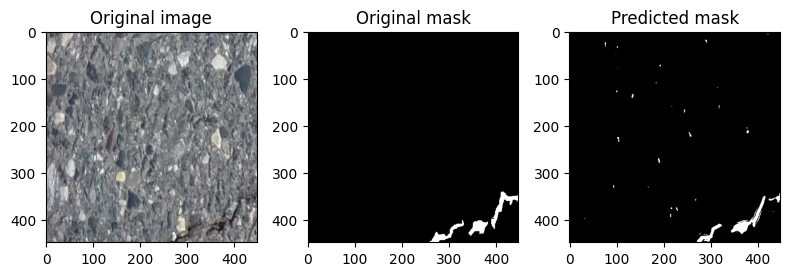

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9934514760971069
actual Classfication out:  1.0


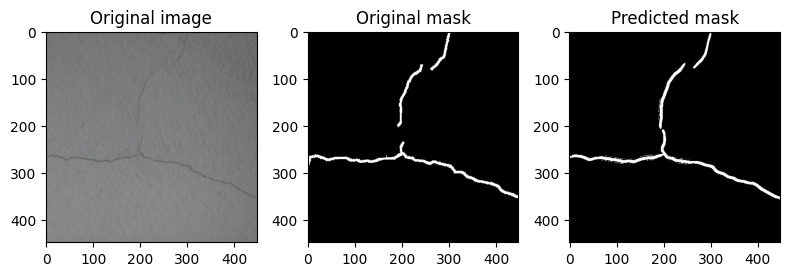

train_data visualize: loss:  2.5016648441993543
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9912653565406799
actual Classfication out:  1.0


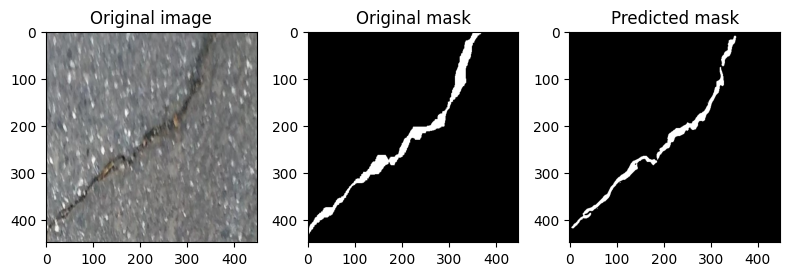

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9988309741020203
actual Classfication out:  1.0


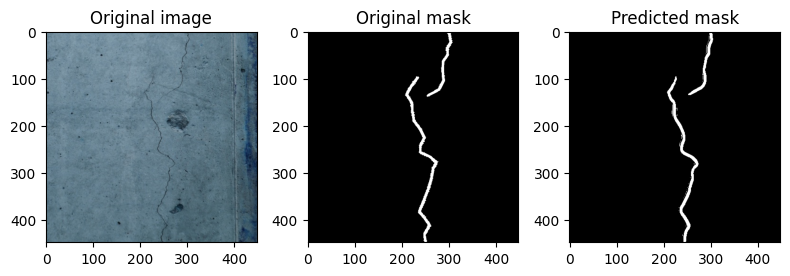

training_loss: 0.41646
training_iou: 0.37773
training_iou: 0.49313
Validation loss: 0.4038
Validation iou: 0.3657
Validation dice: 0.4778
Model saved to: seg_model.pth
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9309871792793274
actual Classfication out:  0.0


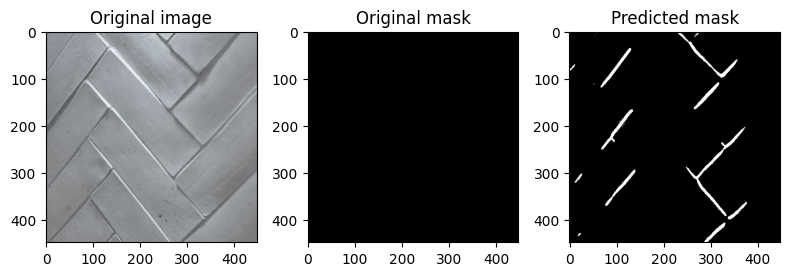

Epoch 5/12


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.387246466622564
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.994486391544342
actual Classfication out:  1.0


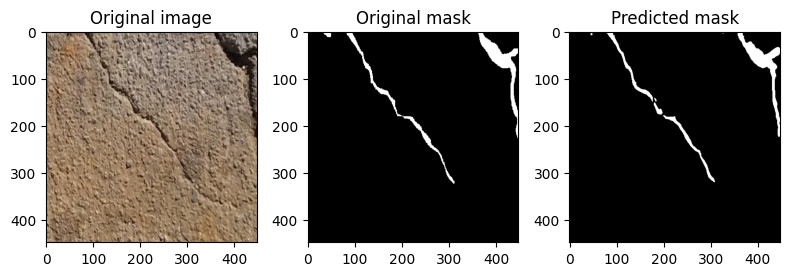

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9976004958152771
actual Classfication out:  1.0


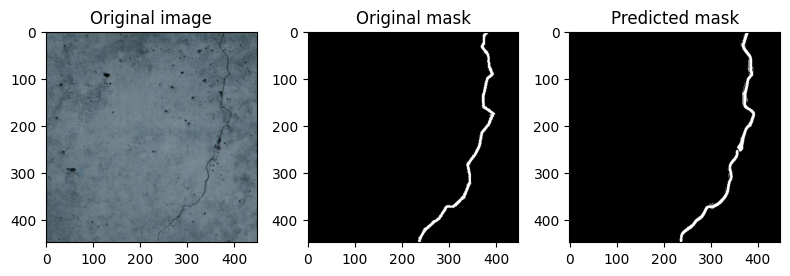

train_data visualize: loss:  0.7739219819677288
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9874271154403687
actual Classfication out:  1.0


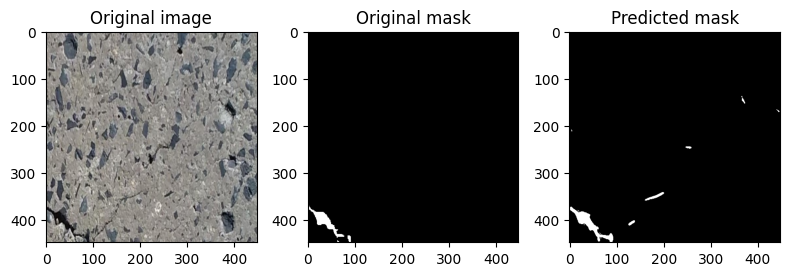

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9973399043083191
actual Classfication out:  1.0


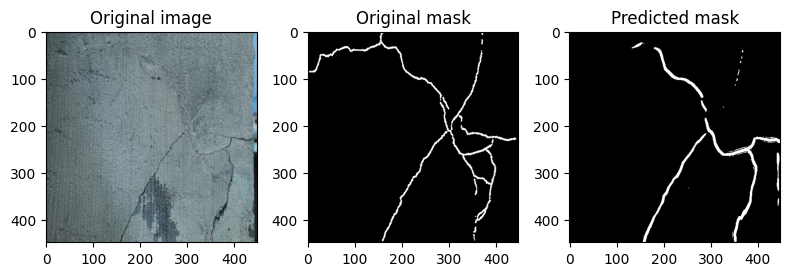

train_data visualize: loss:  1.1491050598362984
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9992468357086182
actual Classfication out:  1.0


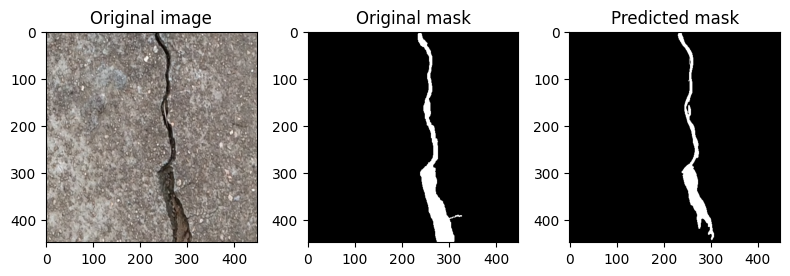

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.005903905723243952
actual Classfication out:  0.0


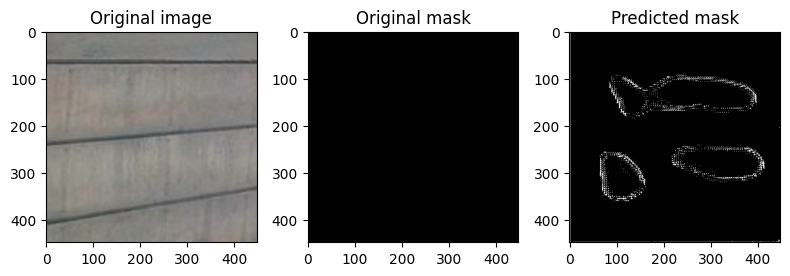

train_data visualize: loss:  1.5184810957297903
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9932792782783508
actual Classfication out:  1.0


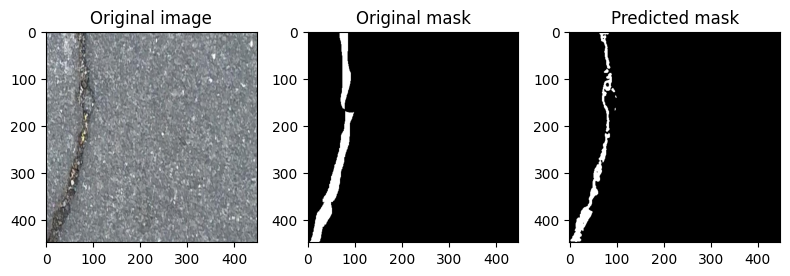

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.8996244072914124
actual Classfication out:  1.0


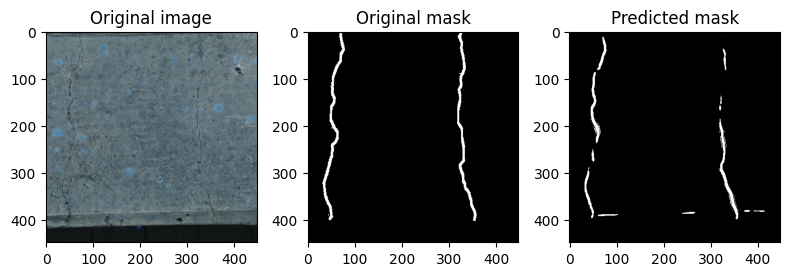

train_data visualize: loss:  1.8821464994270813
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9948689937591553
actual Classfication out:  1.0


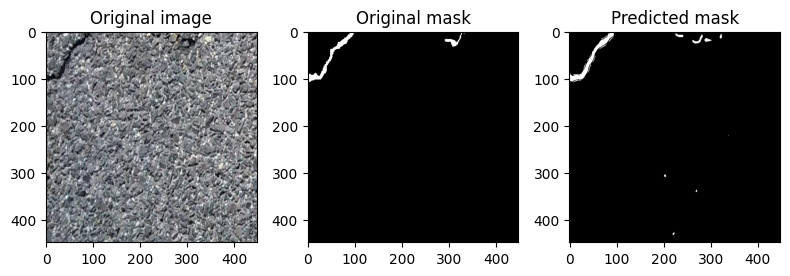

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9967106580734253
actual Classfication out:  1.0


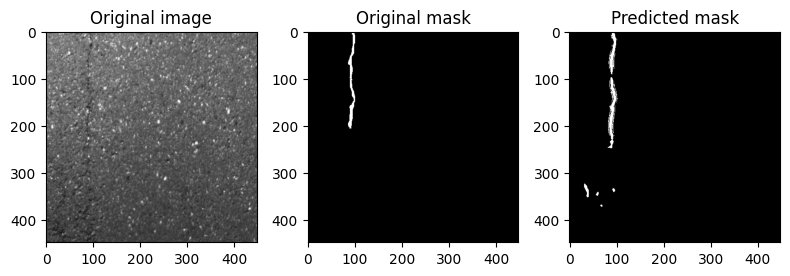

train_data visualize: loss:  2.23810079767199
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9748304486274719
actual Classfication out:  1.0


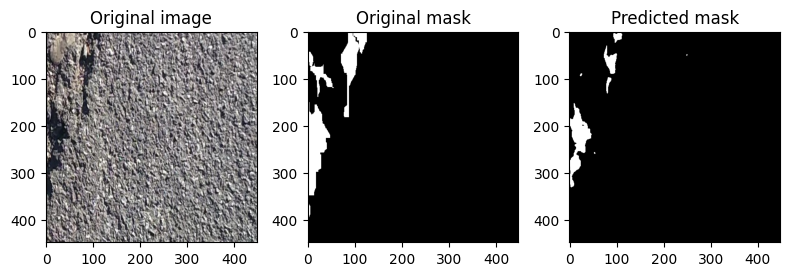

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9973959922790527
actual Classfication out:  1.0


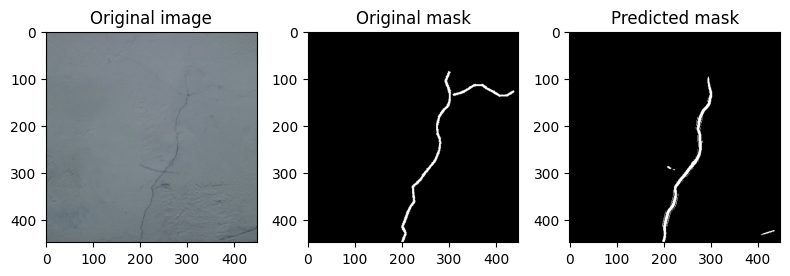

training_loss: 0.37281
training_iou: 0.37918
training_iou: 0.49580
Validation loss: 0.3598
Validation iou: 0.3721
Validation dice: 0.4846
Model saved to: seg_model.pth
Epoch 6/12


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.3434758112935597
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9987611770629883
actual Classfication out:  1.0


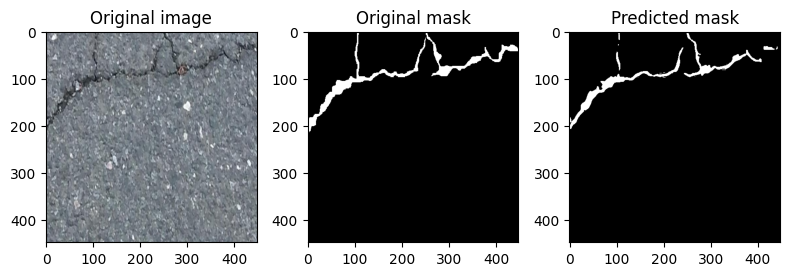

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9979979395866394
actual Classfication out:  1.0


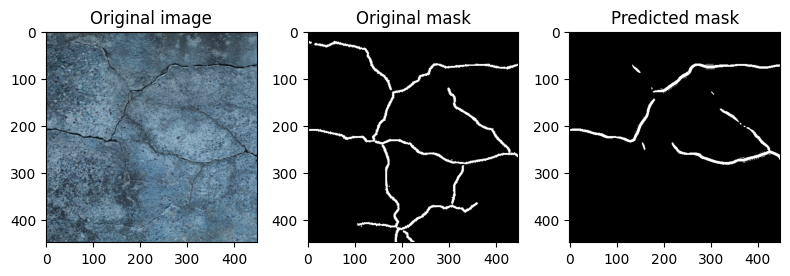

train_data visualize: loss:  0.6818686853635487
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9979483485221863
actual Classfication out:  1.0


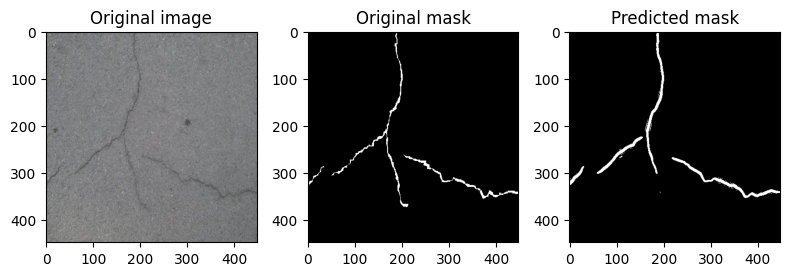

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.998190701007843
actual Classfication out:  1.0


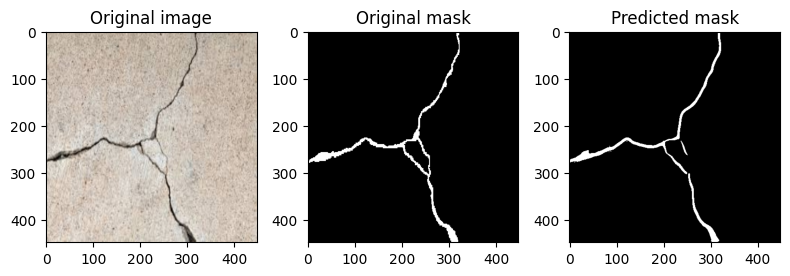

train_data visualize: loss:  1.0165845595410306
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9884878993034363
actual Classfication out:  1.0


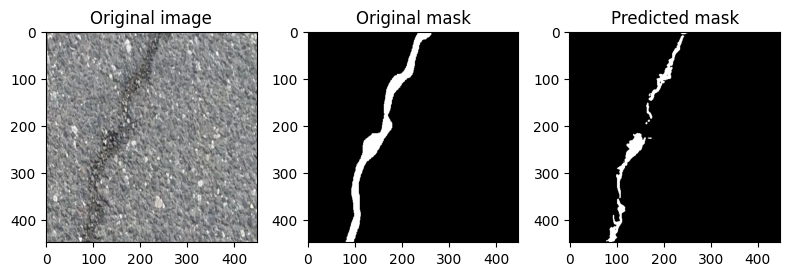

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9695669412612915
actual Classfication out:  1.0


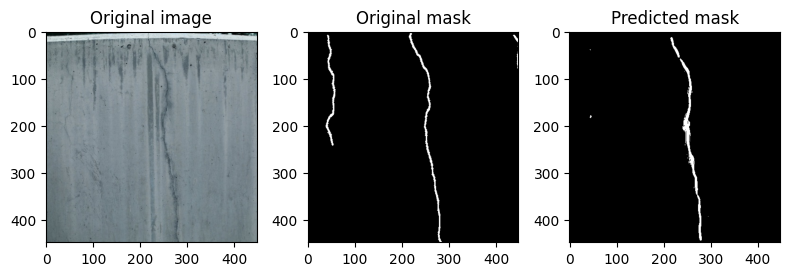

train_data visualize: loss:  1.3446777565725918
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9979599714279175
actual Classfication out:  1.0


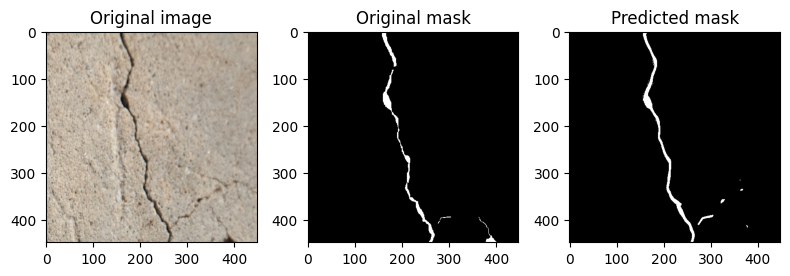

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9691388607025146
actual Classfication out:  1.0


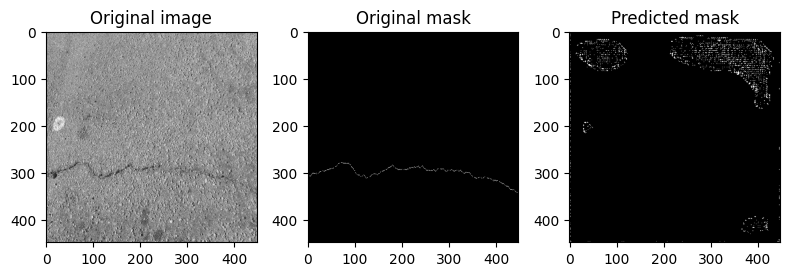

train_data visualize: loss:  1.6683920381838464
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9987273812294006
actual Classfication out:  1.0


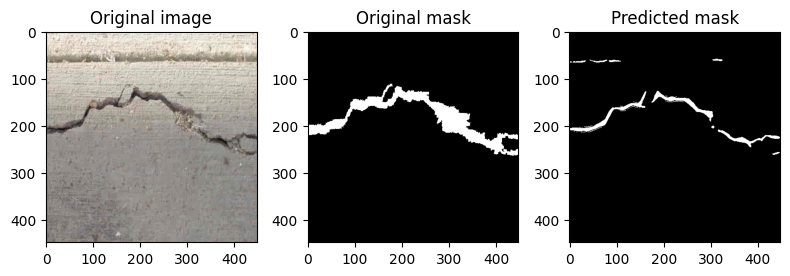

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.01528062392026186
actual Classfication out:  0.0


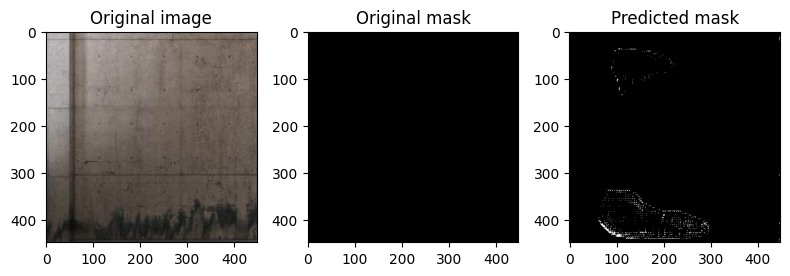

train_data visualize: loss:  2.003614438872032
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9957472681999207
actual Classfication out:  1.0


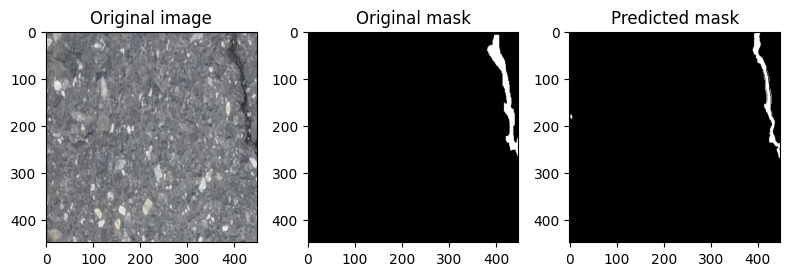

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9843147397041321
actual Classfication out:  1.0


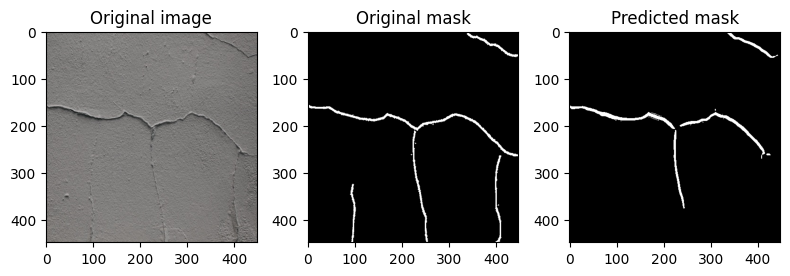

training_loss: 0.33383
training_iou: 0.39012
training_iou: 0.50778
Validation loss: 0.3288
Validation iou: 0.3584
Validation dice: 0.4709
Model saved to: seg_model.pth
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9996678829193115
actual Classfication out:  1.0


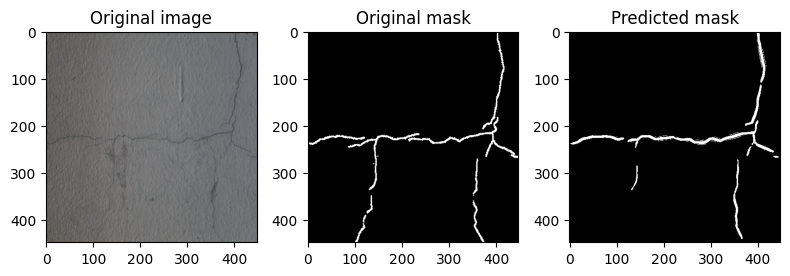

Epoch 7/12


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.3147372998333917
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9992215633392334
actual Classfication out:  1.0


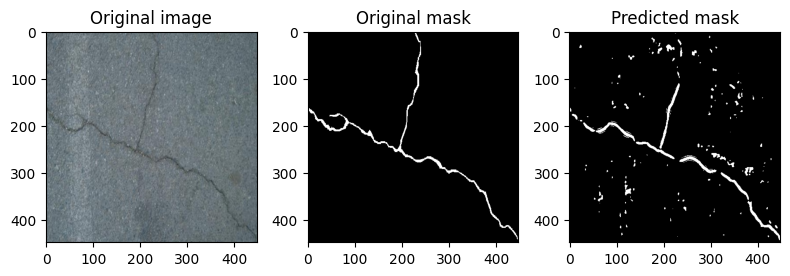

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9994860887527466
actual Classfication out:  1.0


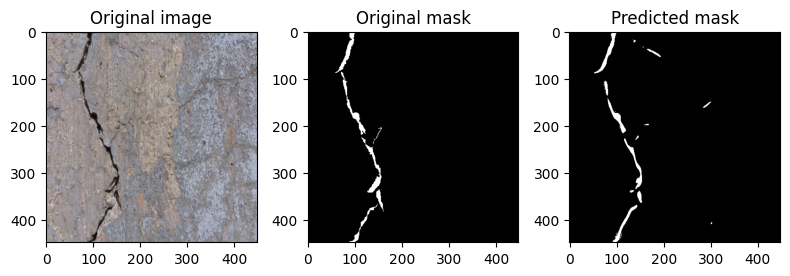

train_data visualize: loss:  0.6171592089342953
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9762362837791443
actual Classfication out:  1.0


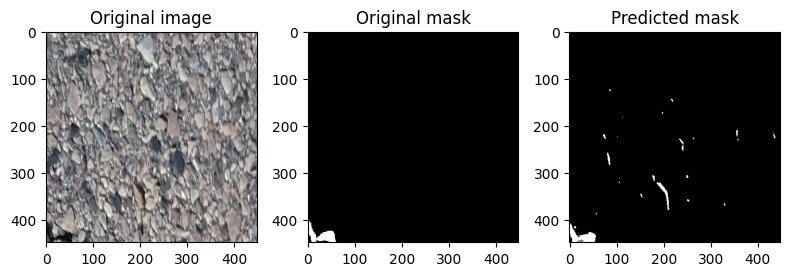

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9998353719711304
actual Classfication out:  1.0


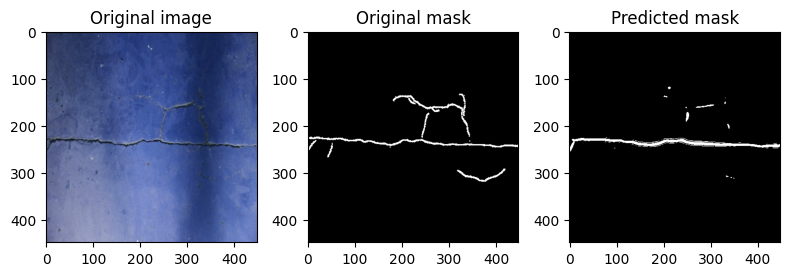

train_data visualize: loss:  0.9211585818987175
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9986901879310608
actual Classfication out:  1.0


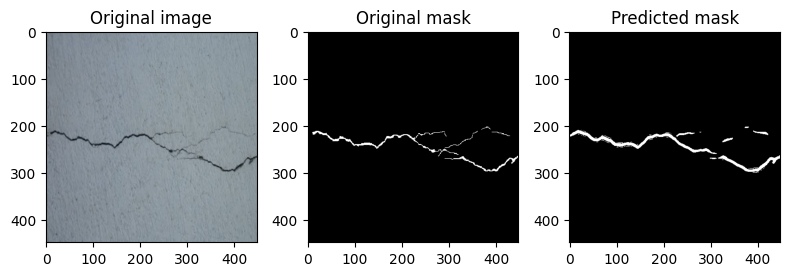

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9995126724243164
actual Classfication out:  1.0


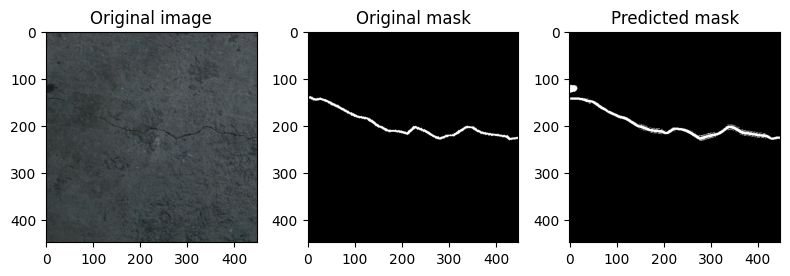

train_data visualize: loss:  1.2246097727802587
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9993388056755066
actual Classfication out:  1.0


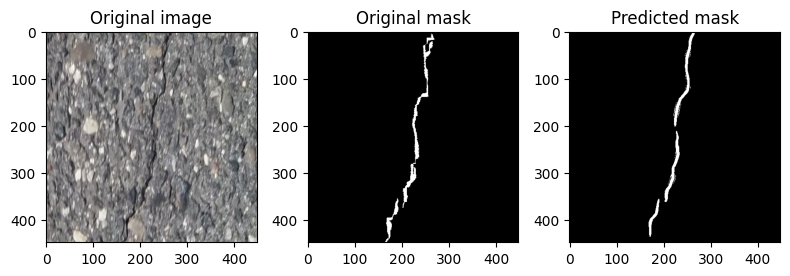

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9995649456977844
actual Classfication out:  1.0


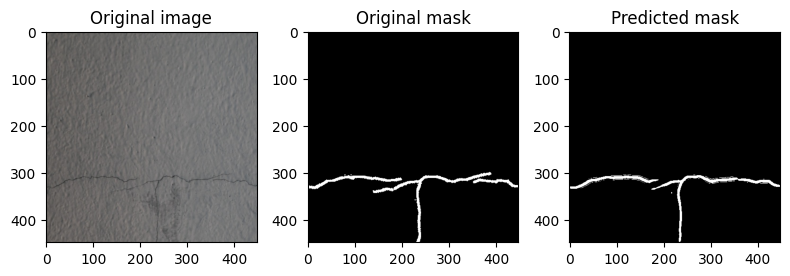

train_data visualize: loss:  1.5149402405534471
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9999222755432129
actual Classfication out:  1.0


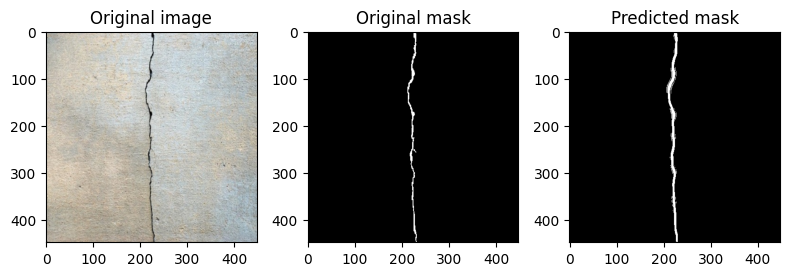

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.99996018409729
actual Classfication out:  1.0


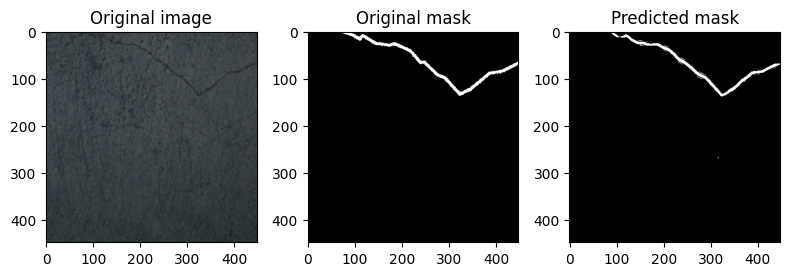

train_data visualize: loss:  1.8062914147459228
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9997678399085999
actual Classfication out:  1.0


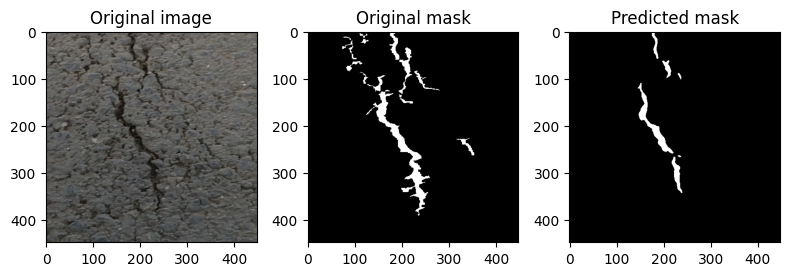

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.01519562117755413
actual Classfication out:  0.0


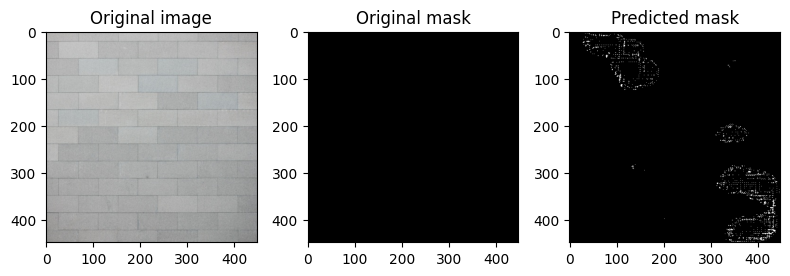

training_loss: 0.30097
training_iou: 0.37364
training_iou: 0.48902
Validation loss: 0.2985
Validation iou: 0.3654
Validation dice: 0.4777
Model saved to: seg_model.pth
Epoch 8/12


  0%|          | 0/1232 [00:00<?, ?it/s]

train_data visualize: loss:  0.2747523170973867
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9996484518051147
actual Classfication out:  1.0


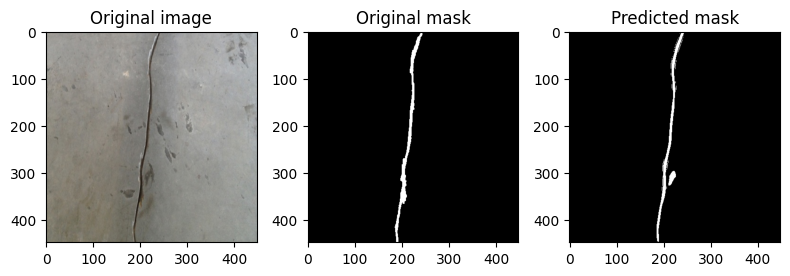

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9994958639144897
actual Classfication out:  1.0


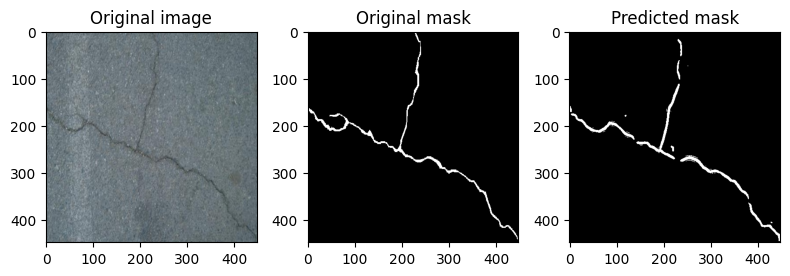

train_data visualize: loss:  0.5481683466528436
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.999618411064148
actual Classfication out:  1.0


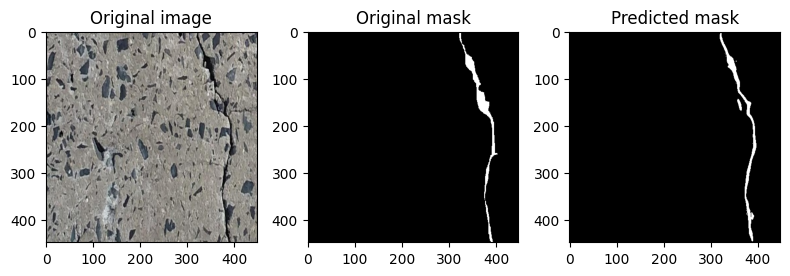

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9984534978866577
actual Classfication out:  1.0


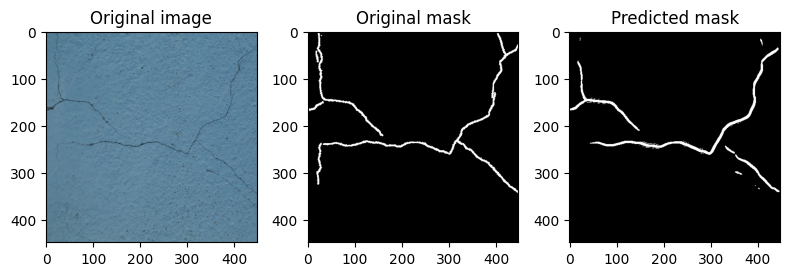

train_data visualize: loss:  0.8224231428994334
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9986414313316345
actual Classfication out:  1.0


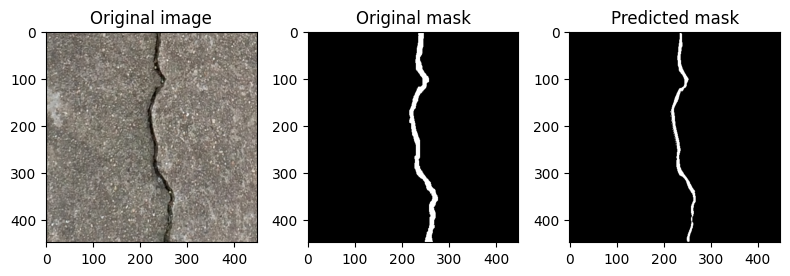

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.016859348863363266
actual Classfication out:  0.0


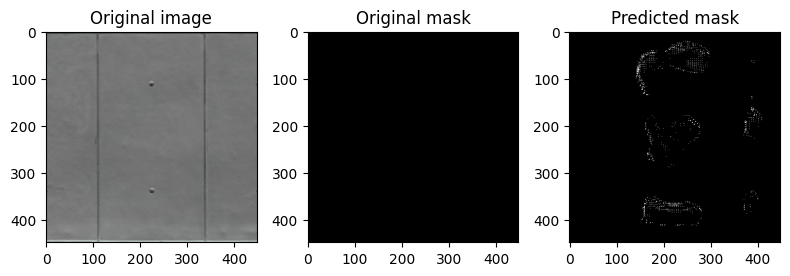

train_data visualize: loss:  1.0867925070483109
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9994342923164368
actual Classfication out:  1.0


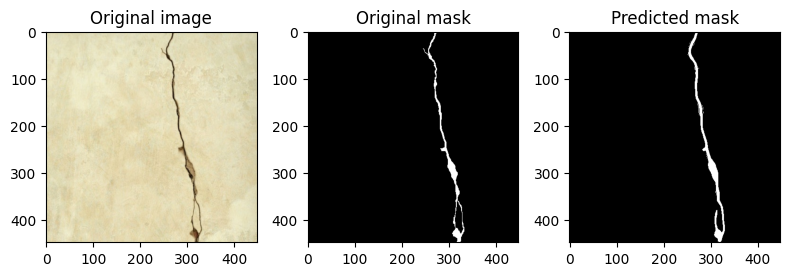

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9996019005775452
actual Classfication out:  1.0


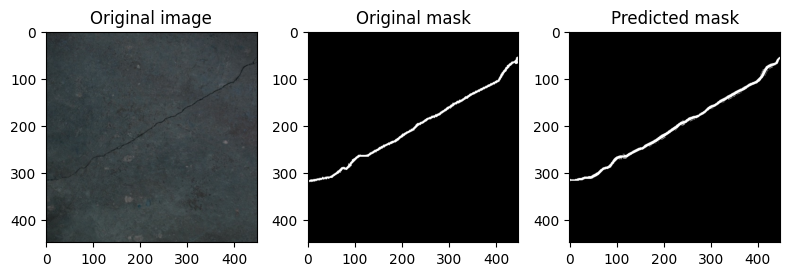

train_data visualize: loss:  1.3553295176604698
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.9995853304862976
actual Classfication out:  1.0


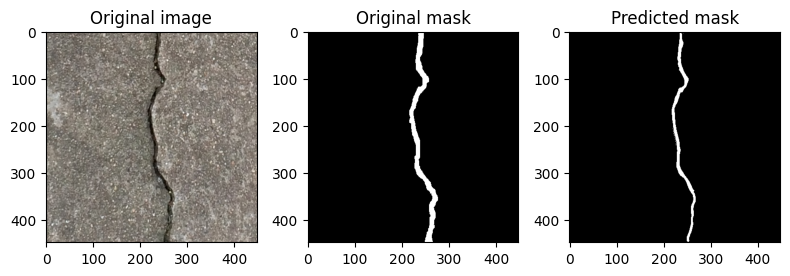

valid_data visualize: 
shape of image torch.Size([1, 3, 448, 448]) mask.shape (448, 448, 1)
Predicted Classfication out:  0.01589769870042801
actual Classfication out:  0.0


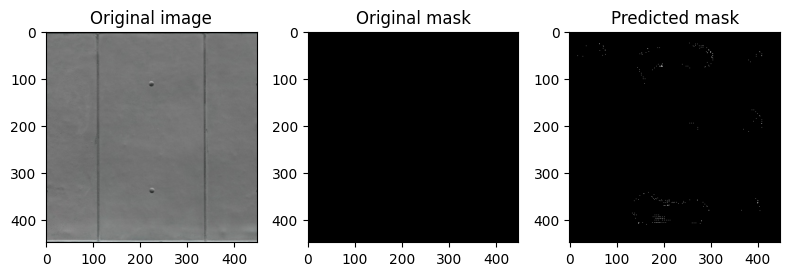

In [ ]:

# epoch loss = total loss

# Define dictionaries to store per-epoch average loss and metrics
training_metrics = {
    'loss': [],
    'dice': [],
    'iou': [],
    'precision': [],
    'recall': [],
    'f1_score': [],
}

validation_metrics = {
    'loss': [],
    'dice': [],
    'iou': [],
    'precision': [],
    'recall': [],
    'f1_score': [],
}
classification_loss=[]
# Training loop
for epoch in range(epochs):
    
    model.train()
    running_seg_loss = 0.0
    running_class_loss=0.0
    epoch_loss = 0.0
    training_metrics_epoch = {
        'loss': [],
        'dice': [],
        'iou': [],
        'precision': [],
        'recall': [],
        'f1_score': [],
    }
    print(f'Epoch {epoch + 1}/{epochs}')
    for batch_idx, (inputs, targets) in enumerate(tqdm(train_dataloader, leave=False)):
        inputs = inputs.to(device)
        targets = targets.to(device)
        class_outs=torch.amax(targets,(2,3))
        class_loss,seg_loss = 0.0,0.0
        running_loss=0.0
        optimizer.zero_grad()
        outputs = model(inputs)
        class_pred,seg_pred=outputs
        seg_loss=seg_loss_ctr(seg_pred,targets)
        class_loss=class_loss_ctr(class_pred,class_outs)
        loss = seg_weight_factor*seg_loss+class_weight_factor*class_loss
        loss.backward()
        optimizer.step()
        
        running_seg_loss += seg_loss.item()
        running_class_loss += class_loss.item()
        running_loss+=loss.item()
        epoch_loss += loss.item()
        
        if (batch_idx +1 )% 203 == 0:
            
            random_number = np.random.randint(1, len(df_valid) + 1)
            
            print("train_data visualize: loss: ",epoch_loss/203)
            validate_test_image(model, df_train,random_number)
            print("valid_data visualize: ")
            validate_test_image(model, df_valid,random_number)
            
        # Calculate metrics for training after every 10th batch
        if (batch_idx + 1) % 5 == 0:
            avg_loss = running_loss / 10  # Average loss for the last 10 batches
             # Reset the running loss
#             print("train_:")
#             print(f"training_RUNNING_SEG_loss: {running_seg_loss/ 5 :.5f}")
#             print(f"training_RUNNING_class_loss: {running_class_loss/ 5 :.5f}")
#             print(f"training_RUNNINng_loss: {runnning_loss/5 :.5f}")
            running_loss = 0.0 
            running_seg_loss = 0.0 
            running_class_loss = 0.0 

            # Calculate and store training metrics using find_metrics
            metrics = find_metrics(seg_pred, targets)  # Adjust threshold if needed
            training_metrics_epoch['loss'].append(avg_loss)
            training_metrics_epoch['dice'].append(metrics['dice'].cpu().item())
            training_metrics_epoch['iou'].append(metrics['iou'].cpu().item())
            training_metrics_epoch['precision'].append(metrics['precision'].cpu().item())
            training_metrics_epoch['recall'].append(metrics['recall'].cpu().item())
            training_metrics_epoch['f1_score'].append(metrics['f1_score'].cpu().item())
#             break
            
            

        
            

    # Calculate the average metrics for this epoch's training batches
    for key, value in training_metrics_epoch.items():
        if value:
            training_metrics[key].append(np.mean(value))
    
    # Calculate and store the average loss for this epoch
    training_metrics['loss'].append(epoch_loss / len(train_dataloader))
#     print("Per EPOCH: loss")
    print(f"training_loss: {epoch_loss / len(train_dataloader):.5f}")
    print(f"training_iou: {training_metrics['iou'][-1]:.5f}")
    print(f"training_iou: {training_metrics['dice'][-1]:.5f}")
    # Calculate validation metrics every 5 epochs
    avg_loss=0.0
    if (epoch + 1) % 1  == 0:
        model.eval()
        validation_loss = 0.0
        validation_metrics_epoch = {
            'loss': [],
            'dice': [],
            'iou': [],
            'precision': [],
            'recall': [],
            'f1_score': [],
        }

        for val_inputs, val_targets in valid_dataloader:
            val_inputs = val_inputs.to(device)
            val_targets = val_targets.to(device)
            val_class_outs=torch.amax(val_targets,(2,3))
            val_outputs = model(val_inputs)
            val_class_pred,val_seg_pred=val_outputs
            val_seg_loss=seg_loss_ctr(val_seg_pred,val_targets)
            val_class_loss=class_loss_ctr(val_class_pred,val_class_outs)
            val_loss = seg_weight_factor*val_seg_loss+class_weight_factor*val_class_loss
#             val_loss = criterion(val_outputs, val_targets)
            
            validation_loss += val_loss.item()

            # Calculate and store validation metrics using find_metrics
            val_metrics = find_metrics(val_seg_pred, val_targets)  # Adjust threshold if needed
            validation_metrics_epoch['loss'].append(val_loss.item())
            validation_metrics_epoch['dice'].append(val_metrics['dice'].cpu().item())
            validation_metrics_epoch['iou'].append(val_metrics['iou'].cpu().item())
            validation_metrics_epoch['precision'].append(val_metrics['precision'].cpu().item())
            validation_metrics_epoch['recall'].append(val_metrics['recall'].cpu().item())
            
            validation_metrics_epoch['f1_score'].append(val_metrics['f1_score'].cpu().item())
#             break
            

           

        avg_validation_loss = validation_loss / len(valid_dataloader)
        avg_loss=avg_validation_loss


        # Calculate the average metrics for this epoch's validation batches
        for key, value in validation_metrics_epoch.items():
            if value:
                validation_metrics[key].append(np.mean(value))

        # Store the average loss for this epoch
        validation_metrics['loss'].append(avg_validation_loss)
        print(f'Validation loss: {avg_validation_loss:.4f}')
        print(f'Validation iou: {validation_metrics["iou"][-1]:.4f}')
        print(f'Validation dice: {validation_metrics["dice"][-1]:.4f}')
        scheduler.step(avg_loss)
        early(avg_loss, model=model)
        if early.early_stop:
            print(f'Validation loss did not improve for {early.patience} epochs. Training stopped.')
            model.load_state_dict(torch.load(path))
            break
        #         print("training_loss",validaion_metrics['loss'][epoch])
#         print("validation_iou",validation_metrics['iou'][epoch])
#         print("validation_dice",validation_metrics['dice'][epoch])

    if (epoch + 1) % 2 == 0:
            validate_test_image(model, df_valid)

    if (epoch + 1) == 3:
    # Define the path where you want to save the model
        model_path = path

        # Save the model's state_dict
        torch.save(model.state_dict(), model_path)

        print(f'Model saved after 3 epochs to {model_path}')
    torch.cuda.empty_cache()   

# Scheduler step (if using a learning rate scheduler)
 # Step based on the last validation loss


In [117]:
x = torch.randn(1,448)

In [118]:
x.shape

torch.Size([1, 448])

In [122]:
# torch.amax(x,(1,2))

IndexError: Dimension out of range (expected to be in range of [-2, 1], but got 2)

In [123]:
torch.amax(x,(1,2))

In [124]:
x2 = torch.randint(0, 2, size=(4,1,448,448), dtype=torch.float32)

In [125]:
x2.shape

torch.Size([4, 1, 448, 448])

In [126]:
torch.amax(x2,(2,3)).shape

torch.Size([4, 1])

In [127]:
targets=torch.rand(4,1,448,448)
class_outs=torch.amax(targets,(2,3))
class_outs.shape

torch.Size([4, 1])

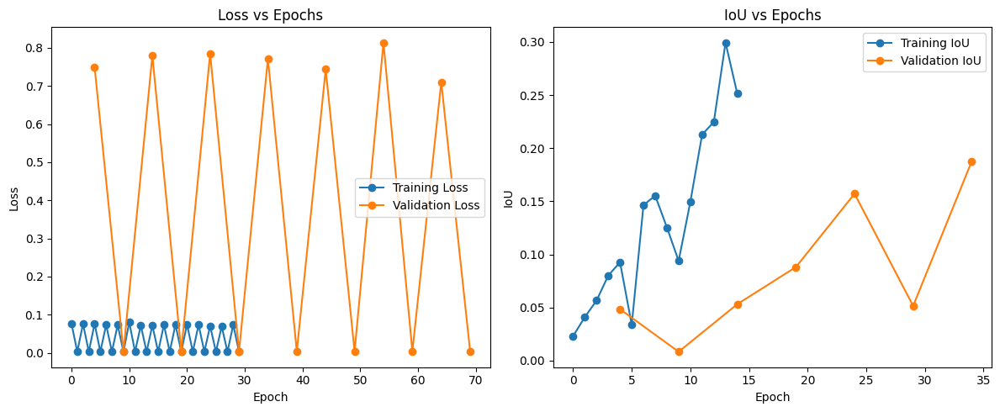

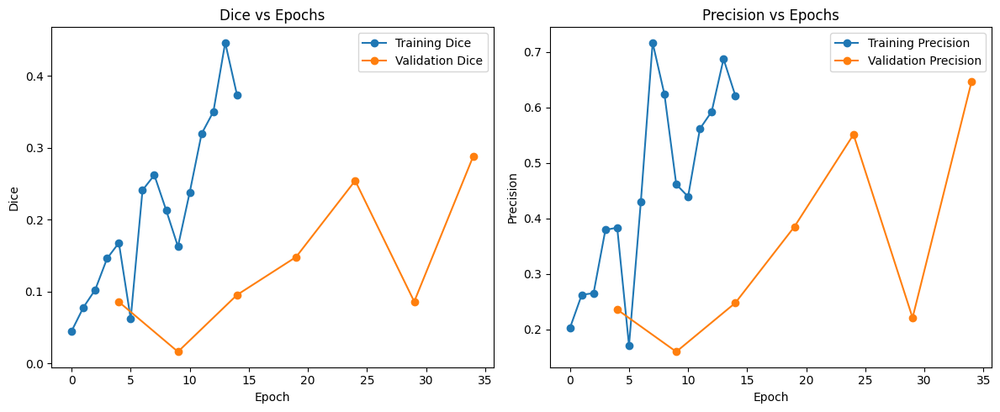

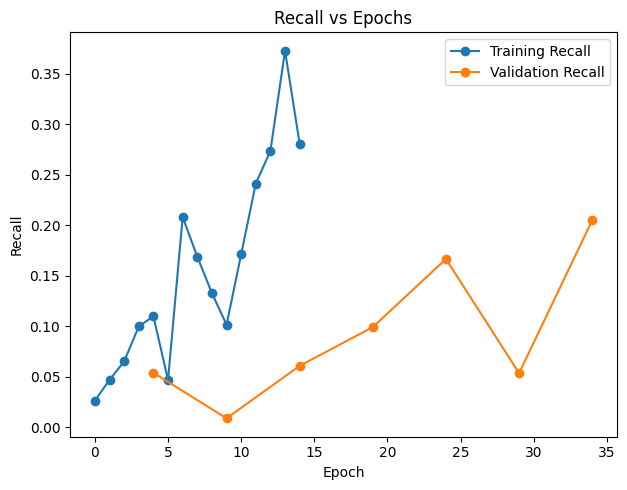

In [128]:
import matplotlib.pyplot as plt

# Assuming you have stored your metrics as dictionaries
# training_metrics and validation_metrics

# Extract the metrics
train_loss = training_metrics['loss']
train_iou = training_metrics['iou']
train_dice = training_metrics['dice']
train_precision = training_metrics['precision']
train_recall = training_metrics['recall']

val_loss = validation_metrics['loss']
val_iou = validation_metrics['iou']
val_dice = validation_metrics['dice']
val_precision = validation_metrics['precision']
val_recall = validation_metrics['recall']

# Create plots for Loss vs Epochs
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(range(len(train_loss)), train_loss, label='Training Loss', marker='o')
plt.plot(range(4, len(val_loss) * 5, 5), val_loss, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs Epochs')
plt.legend()

# Create plots for IoU vs Epochs
plt.subplot(1, 2, 2)
plt.plot(range(len(train_iou)), train_iou, label='Training IoU', marker='o')
plt.plot(range(4, len(val_iou) * 5, 5), val_iou, label='Validation IoU', marker='o')
plt.xlabel('Epoch')
plt.ylabel('IoU')
plt.title('IoU vs Epochs')
plt.legend()

plt.tight_layout()
plt.show()

# Create plots for Dice vs Epochs
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(range(len(train_dice)), train_dice, label='Training Dice', marker='o')
plt.plot(range(4, len(val_dice) * 5, 5), val_dice, label='Validation Dice', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Dice')
plt.title('Dice vs Epochs')
plt.legend()

# Create plots for Precision vs Epochs
plt.subplot(1, 2, 2)
plt.plot(range(len(train_precision)), train_precision, label='Training Precision', marker='o')
plt.plot(range(4, len(val_precision) * 5, 5), val_precision, label='Validation Precision', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Precision')
plt.title('Precision vs Epochs')
plt.legend()

plt.tight_layout()
plt.show()

# Create plots for Recall vs Epochs
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(range(len(train_recall)), train_recall, label='Training Recall', marker='o')
plt.plot(range(4, len(val_recall) * 5, 5), val_recall, label='Validation Recall', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Recall')
plt.title('Recall vs Epochs')
plt.legend()

plt.tight_layout()
plt.show()
